In [1]:
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import Bio.SeqIO as SeqIO
import sys
from tqdm import tqdm
import re
import scipy.stats as stats
from pygenomeviz import GenomeViz
from scipy.stats import ttest_rel
from scipy.stats import pearsonr
from matplotlib.lines import Line2D
import seaborn as sns
import os
from scipy.stats import ttest_rel
import warnings
warnings.filterwarnings("ignore")
import math
sys.path.append('/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/analysis')
from transcriptomics import *
from hcr import *
from primers import * 
from plotting import * 
black_plotting()

Initializing transcriptomics package
Initializing HCR package
Initializing custom primer package
Initializing plotting package


In [2]:
sc.set_figure_params(dpi=100, color_map="viridis_r")
sc.settings.verbosity = 0 
sc.logging.print_header()

scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.1 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


In [3]:
# set pd max columns to 100 and max rows to 10 
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 10)

## Genome

In [4]:
# Load genome
genome_fasta_path = '/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/genome/GCF_003227715.2_Hsal_v8.6_genomic.fna'
genome_seq = SeqIO.to_dict(SeqIO.parse(genome_fasta_path, "fasta"))

In [5]:
# Get number of scaffolds 
scaffolds = list(genome_seq.keys())
print(f'Number of scaffolds: {len(scaffolds)}')

# Make a dictionary of scaffold lengths
scaffold_lengths = {scaffold:len(genome_seq[scaffold].seq) for scaffold in scaffolds}
scaffold_lengths = pd.DataFrame.from_dict(scaffold_lengths, orient='index', columns=['length'])
scaffold_lengths = scaffold_lengths.sort_values(by='length', ascending=False)
scaffold_lengths

Number of scaffolds: 850


,length
NW_020230721.1,3353128
NW_020230183.1,3092591
NW_020230404.1,3063442
NW_020230531.1,2893175
NW_020230039.1,2819439
...,...
NW_020230259.1,8806
NW_020230430.1,8538
NW_020230613.1,7672
NW_020230167.1,6468


## Custom OR Transcriptome
- Gene uses `gene_id` and transcript uses `transcript_id`
- Only run this once

In [6]:
"""genome_fasta_path = '/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/genome/GCF_003227715.2_Hsal_v8.6_genomic.fna'
transcriptome_path = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/GSE235819_HSAL60.gtf"
object_name = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/hsaltator_transcriptome"
update_transcriptome_object(genome_fasta_path, transcriptome_path, object_name, save_biotype=False)"""

'genome_fasta_path = \'/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/genome/GCF_003227715.2_Hsal_v8.6_genomic.fna\'\ntranscriptome_path = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/GSE235819_HSAL60.gtf"\nobject_name = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/hsaltator_transcriptome"\nupdate_transcriptome_object(genome_fasta_path, transcriptome_path, object_name, save_biotype=False)'

In [7]:
object_name = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/hsaltator_transcriptome"
tr = load_transcriptome_object(object_name)

In [8]:
check_exons_contain_all_features(tr)

## NCBI Transcriptome 
- Includes lncRNAs 

In [9]:
"""genome_fasta_path = '/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/genome/GCF_003227715.2_Hsal_v8.6_genomic.fna'
transcriptome_path = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/Hsal_v86_ncbi_transcriptome.gtf"
object_name = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/hsaltator_transcriptome_ncbi"
update_transcriptome_object(genome_fasta_path, transcriptome_path, object_name, save_biotype=True)"""

'genome_fasta_path = \'/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/genome/GCF_003227715.2_Hsal_v8.6_genomic.fna\'\ntranscriptome_path = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/Hsal_v86_ncbi_transcriptome.gtf"\nobject_name = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/hsaltator_transcriptome_ncbi"\nupdate_transcriptome_object(genome_fasta_path, transcriptome_path, object_name, save_biotype=True)'

In [10]:
object_name = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/transcriptome/hsaltator_transcriptome_ncbi"
tr_ncbi = load_transcriptome_object(object_name)

In [11]:
check_exons_contain_all_features(tr_ncbi)

In [12]:
all_genes = [tr_ncbi.get_gene(gene) for gene in tr_ncbi.genes.keys() if len(tr_ncbi.get_gene(gene).transcripts) > 0]
all_lncRNAs = [gene for gene in all_genes if gene.transcripts[0].biotype == 'lnc_RNA']
len(all_lncRNAs), len(all_genes)

(1029, 14020)

## OR DB

In [13]:
all_genes = [tr.get_gene(gene) for gene in tr.genes.keys() if len(tr.get_gene(gene).transcripts) > 0]

In [14]:
# Get a list of all genes 
all_genes = list(tr.genes.keys())
all_ORs = [gene for gene in all_genes if "HsOr" in gene]
print(f"Identified {len(all_ORs)} OR genes")

Identified 377 OR genes


In [15]:
# Look for any ORs that don't contain a number 
ORs_no_number = [gene for gene in all_ORs if not re.search(r'\d', gene)]
ORs_no_number

['HsOrco']

In [16]:
# Get tuning ORs 
ORXs = [gene for gene in all_ORs if re.search(r'\d', gene)]

In [17]:
# Look for ORX containing "_" 
ORXs_with_underscore = [gene for gene in ORXs if "_" in gene]
print(f"Identified {len(ORXs_with_underscore)} ORX genes with underscore: {ORXs_with_underscore}")
# Remove ORXs with underscore
ORXs = [gene for gene in ORXs if gene not in ORXs_with_underscore]
print("removed ORXs with underscore")

Identified 1 ORX genes with underscore: ['HsOr126_127']
removed ORXs with underscore


In [18]:
# Creat DF containing gene name and number
all_ORX_float = [float(gene.split("HsOr")[1]) for gene in ORXs]
ORXs = pd.DataFrame({"gene_name": ORXs, "gene_number": all_ORX_float})

In [19]:
# Save the scaffold, start, end, strand, n_exons, and nine_exon columns
for i, row in ORXs.iterrows():
    gene = row["gene_name"]
    gene_obj = tr.get_gene(gene)
    if len(gene_obj.transcripts) > 0: 
        transcript = gene_obj.get_transcript_longest_cds() 
        scaffold = transcript.chromosome 
        start, end = transcript.get_bounds() 
        strand = transcript.strand
        n_exons = len(transcript.exons)
        ORXs.loc[i, "scaffold"] = scaffold
        ORXs.loc[i, "start"] = start
        ORXs.loc[i, "end"] = end
        ORXs.loc[i, "strand"] = strand
        ORXs.loc[i, "n_exons"] = n_exons
        ORXs.loc[i, "nine_exon"] = n_exons == 9
    else:
        print(f"ORX {gene} has no transcripts")
ORXs

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon
0,HsOr10,10.0,NW_020229890.1,1306224.0,1308880.0,-,5.0,False
1,HsOr100,100.0,NW_020230518.1,134832.0,138001.0,+,7.0,False
2,HsOr101,101.0,NW_020230518.1,125705.0,129088.0,+,6.0,False
3,HsOr102,102.0,NW_020230518.1,118877.0,123689.0,+,5.0,False
4,HsOr103,103.0,NW_020230518.1,115171.0,117559.0,+,6.0,False
...,...,...,...,...,...,...,...,...
370,HsOr95,95.0,NW_020230518.1,162967.0,165348.0,+,7.0,False
371,HsOr96,96.0,NW_020230518.1,155815.0,159847.0,+,7.0,False
372,HsOr97,97.0,NW_020230518.1,152000.0,155038.0,+,7.0,False
373,HsOr98,98.0,NW_020230518.1,145405.0,149507.0,+,7.0,False


In [20]:
# Sort by scaffold and start 
ORXs_sorted = ORXs.sort_values(["scaffold", "start"]).reset_index(drop=True)
ORXs_sorted['rank'] = ORXs_sorted.index 
ORXs_sorted

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon,rank
0,HsOr44,44.0,NW_020229890.1,1212870.0,1216852.0,-,7.0,False,0
1,HsOr45,45.0,NW_020229890.1,1218489.0,1221077.0,-,5.0,False,1
2,HsOr46,46.0,NW_020229890.1,1221616.0,1225747.0,-,7.0,False,2
3,HsOr47,47.0,NW_020229890.1,1227302.0,1229819.0,-,5.0,False,3
4,HsOr48,48.0,NW_020229890.1,1233006.0,1235746.0,-,6.0,False,4
...,...,...,...,...,...,...,...,...,...
370,HsOr207,207.0,NW_020230682.1,876755.0,880643.0,+,5.0,False,370
371,HsOr206,206.0,NW_020230682.1,881680.0,884301.0,+,4.0,False,371
372,HsOr205,205.0,NW_020230682.1,892748.0,897334.0,+,4.0,False,372
373,HsOr204,204.0,NW_020230682.1,900916.0,905034.0,+,5.0,False,373


In [21]:
# Count how many ORs are 9E 
n_nine_exon_ORs = ORXs["nine_exon"].sum()
print(f"Identified {n_nine_exon_ORs} 9-exon ORs")

Identified 101 9-exon ORs


## Annotate Tandem Arrays

In [22]:
ta_db_path = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/ORs/adk9000_Table_S3.xlsx"
ta_db = pd.read_excel(ta_db_path)
ta_db.head(3)

,locus,scaffold,coordinates,Ors_within_locus,number_of_Ors_within_locus,Or_expression_in_mutant,neighboring_non-Or(s)_with_similar_non-neuronal_expression,is_any_such_non-Or_directly_bordering_the_Or_locus
0,1,NW_020229890.1,1212870-1424437,"HsOr44-HsOr59, HsOr2-HsOr43",58,"HsOr49-HsOr53 in support cells, HsOr58 in glia...","LOC105188517.LOC112589549, G918",NO
1,2,NW_020230427.1,620807-959418,"HsOr325-HsOr306, HsOr326-HsOr351",44,"all genes in support cells, possibly also glia","LOC105182725, LOC105182715, LOC105182711, LOC1...",YES
2,3,NW_020229910.1,510020-673088,"HsOr170-HsOr167, HsOr131.1-HsOr166",39,"HsOr160, HsOr161 in support cells",G1637,NO


In [23]:
# Assert that every scaffold in ta_db.scaffold is in the genome
assert ta_db.scaffold.isin(scaffold_lengths.index).all()

In [24]:
# Assert that every scaffold in ORXs_sorted.scaffold is in ta_db.scaffold
assert ORXs_sorted.scaffold.isin(ta_db.scaffold).all()

In [25]:
# Make a df called or_db containing a list of ORs and their respective TAs 
or_db = []
for i, ta_row in ta_db.iterrows():
    ors = ta_row["Ors_within_locus"] 
    ta = ta_row["locus"]
    ta_scaffold = ta_row["scaffold"]
    ta_coords = ta_row["coordinates"]
    ta_size = ta_row["number_of_Ors_within_locus"]
    # Find ORs within the locus 
    ta_start = int(ta_coords.split("-")[0]) - 100
    ta_end = int(ta_coords.split("-")[1]) + 100
    for j, orx_row in ORXs_sorted.iterrows():
        orx = orx_row["gene_name"]
        orx_scaffold = orx_row["scaffold"]
        orx_start = orx_row["start"]
        orx_end = orx_row["end"]
        if orx_scaffold == ta_scaffold and orx_start >= ta_start and orx_end <= ta_end:
            orx_row["tandem_array"] = ta
            orx_row["ta_size"] = ta_size
            or_db.append(orx_row)

or_db = pd.DataFrame(or_db)
# Sort by TA and rank 
or_db = or_db.sort_values(["scaffold", "start"]).reset_index(drop=True)
or_db

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon,rank,tandem_array,ta_size
0,HsOr44,44.0,NW_020229890.1,1212870.0,1216852.0,-,7.0,False,0,1,58
1,HsOr45,45.0,NW_020229890.1,1218489.0,1221077.0,-,5.0,False,1,1,58
2,HsOr46,46.0,NW_020229890.1,1221616.0,1225747.0,-,7.0,False,2,1,58
3,HsOr47,47.0,NW_020229890.1,1227302.0,1229819.0,-,5.0,False,3,1,58
4,HsOr48,48.0,NW_020229890.1,1233006.0,1235746.0,-,6.0,False,4,1,58
...,...,...,...,...,...,...,...,...,...,...,...
368,HsOr207,207.0,NW_020230682.1,876755.0,880643.0,+,5.0,False,370,16,6
369,HsOr206,206.0,NW_020230682.1,881680.0,884301.0,+,4.0,False,371,16,6
370,HsOr205,205.0,NW_020230682.1,892748.0,897334.0,+,4.0,False,372,16,6
371,HsOr204,204.0,NW_020230682.1,900916.0,905034.0,+,5.0,False,373,16,6


In [26]:
# Check that the TA_size column reflects the number of ORs in each TA
for ta in or_db.tandem_array.unique():
    ta_size = or_db.loc[or_db.tandem_array == ta, "ta_size"].values[0]
    ors_in_ta = or_db.loc[or_db.tandem_array == ta].shape[0]
    if ta_size != ors_in_ta:
        print(f"TA {ta} has {ta_size} ORs in or_db but {ors_in_ta} ORs in the TA DB")

TA 9 has 13 ORs in or_db but 12 ORs in the TA DB
TA 5 has 30 ORs in or_db but 29 ORs in the TA DB


In [27]:
# Save the ta_index: the index of each OR within its TA
or_db = or_db.sort_values(["scaffold", "start"]).reset_index(drop=True)
for ta in or_db.tandem_array.unique():
    ta_size = or_db.loc[or_db.tandem_array == ta].shape[0]
    for i in range(ta_size):
        or_db.loc[or_db.tandem_array == ta, "ta_index"] = range(ta_size)

# Save the predominant strand of each TA 
for ta in or_db.tandem_array.unique():
    ta_strand = or_db.loc[or_db.tandem_array == ta, "strand"].value_counts().index[0]
    or_db.loc[or_db.tandem_array == ta, "ta_strand"] = ta_strand 


or_db

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon,rank,tandem_array,ta_size,ta_index,ta_strand
0,HsOr44,44.0,NW_020229890.1,1212870.0,1216852.0,-,7.0,False,0,1,58,0.0,-
1,HsOr45,45.0,NW_020229890.1,1218489.0,1221077.0,-,5.0,False,1,1,58,1.0,-
2,HsOr46,46.0,NW_020229890.1,1221616.0,1225747.0,-,7.0,False,2,1,58,2.0,-
3,HsOr47,47.0,NW_020229890.1,1227302.0,1229819.0,-,5.0,False,3,1,58,3.0,-
4,HsOr48,48.0,NW_020229890.1,1233006.0,1235746.0,-,6.0,False,4,1,58,4.0,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,HsOr207,207.0,NW_020230682.1,876755.0,880643.0,+,5.0,False,370,16,6,1.0,+
369,HsOr206,206.0,NW_020230682.1,881680.0,884301.0,+,4.0,False,371,16,6,2.0,+
370,HsOr205,205.0,NW_020230682.1,892748.0,897334.0,+,4.0,False,372,16,6,3.0,+
371,HsOr204,204.0,NW_020230682.1,900916.0,905034.0,+,5.0,False,373,16,6,4.0,+


In [28]:
# How many unique TAs? 
n_unique_tas = or_db.tandem_array.nunique()
print(f"Identified {n_unique_tas} unique TAs")

Identified 43 unique TAs


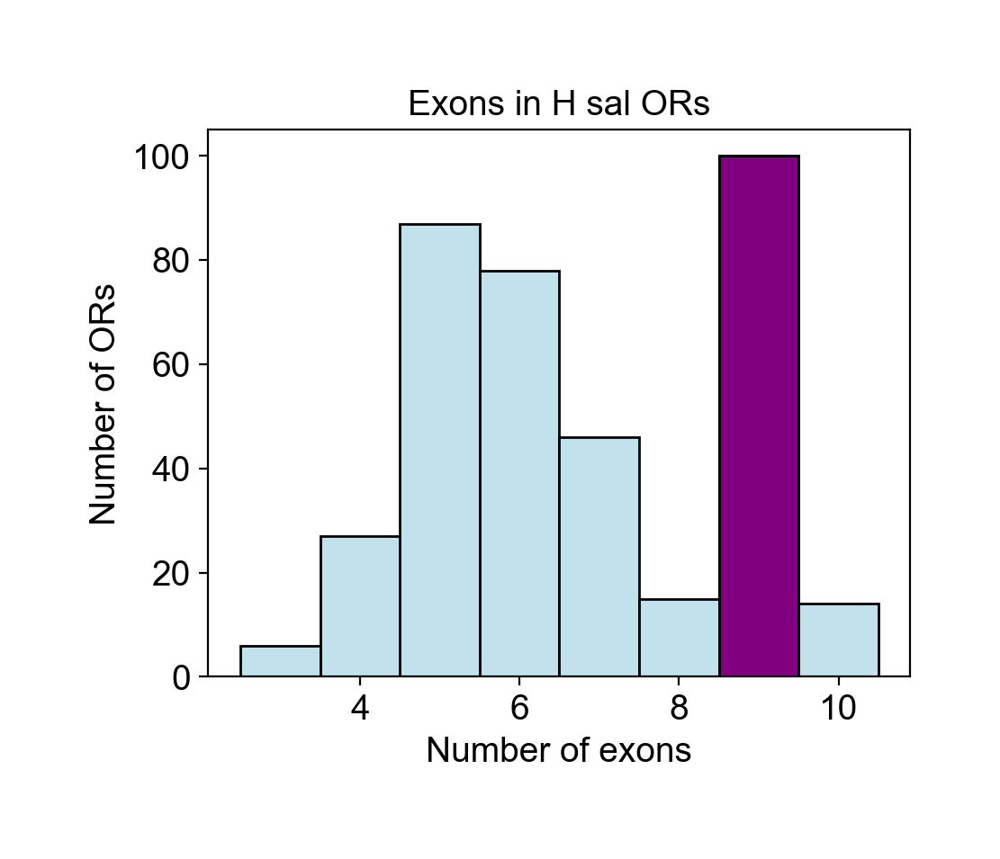

In [29]:
# Plot the distribution of exon numbers in ORs
white_plotting()
plt.figure(figsize=(5, 4))
sns.histplot(or_db["n_exons"], color="lightblue", discrete=True)
plt.bar(9, or_db["n_exons"].value_counts()[9], color="purple", edgecolor="black", width=1)
plt.xlabel("Number of exons")
plt.ylabel("Number of ORs")
plt.title("Exons in H sal ORs")
plt.show()

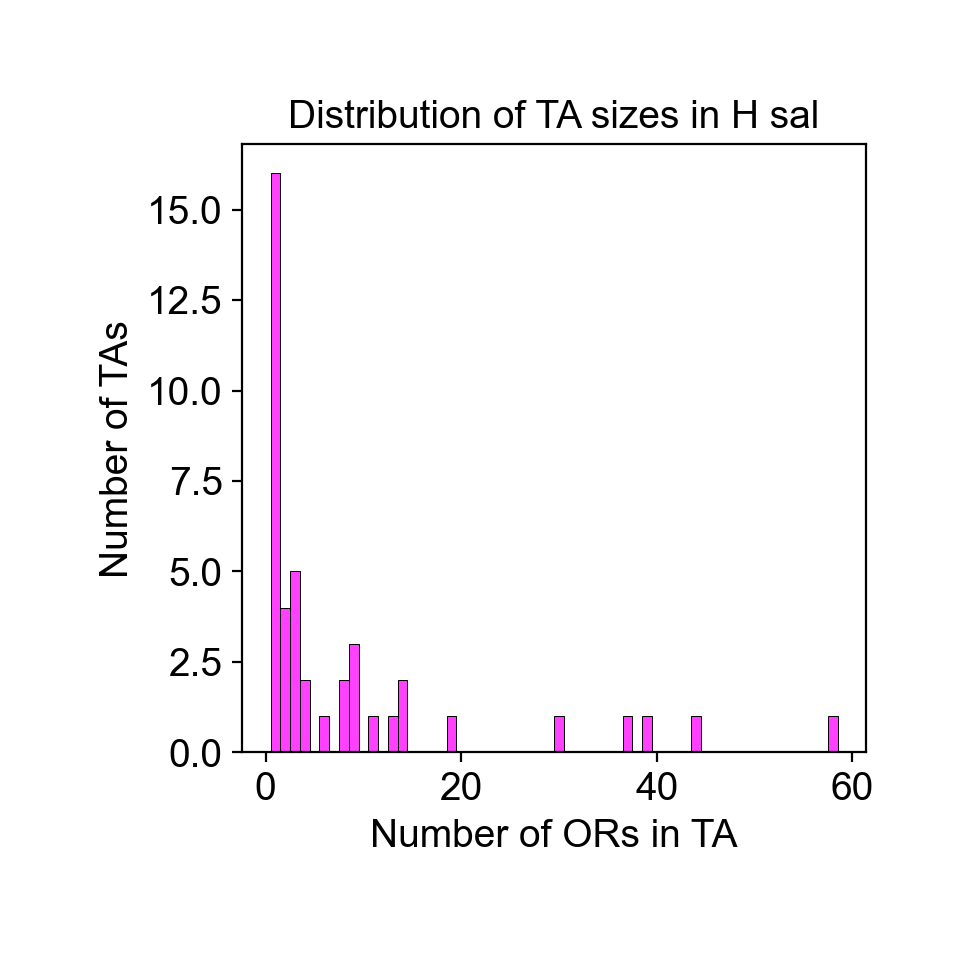

In [30]:
# Plot the distribution of TA sizes
first_rows = or_db.groupby('tandem_array').first()
white_plotting()
plt.figure(figsize=(4, 4))
sns.histplot(first_rows.ta_size, color="magenta", discrete=True)
plt.xlabel("Number of ORs in TA")
plt.ylabel("Number of TAs")
plt.title("Distribution of TA sizes in H sal")
plt.show()

In [31]:
or_db.loc[or_db.tandem_array == 5]

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon,rank,tandem_array,ta_size,ta_index,ta_strand
262,HsOr273,273.0,NW_020230432.1,1083586.0,1086557.0,+,9.0,True,263,5,30,0.0,+
263,HsOr274,274.0,NW_020230432.1,1087100.0,1090561.0,+,9.0,True,264,5,30,1.0,+
264,HsOr275,275.0,NW_020230432.1,1091674.0,1094218.0,+,8.0,False,265,5,30,2.0,+
265,HsOr276,276.0,NW_020230432.1,1094591.0,1098018.0,+,9.0,True,266,5,30,3.0,+
266,HsOr277,277.0,NW_020230432.1,1098591.0,1101605.0,+,9.0,True,267,5,30,4.0,+
...,...,...,...,...,...,...,...,...,...,...,...,...,...
286,HsOr297,297.0,NW_020230432.1,1176759.0,1181808.0,+,10.0,False,287,5,30,24.0,+
287,HsOr298,298.0,NW_020230432.1,1182132.0,1185592.0,+,9.0,True,288,5,30,25.0,+
288,HsOr299,299.0,NW_020230432.1,1186102.0,1190408.0,+,9.0,True,289,5,30,26.0,+
289,HsOr300,300.0,NW_020230432.1,1191508.0,1195573.0,+,9.0,True,290,5,30,27.0,+


## Look for Deorphanized ORs 
Pask, G. M., Slone, J. D., Millar, J. G., Das, P., Moreira, J. A., Zhou, X., Bello, J., Berger, S. L., Bonasio, R., Desplan, C., Reinberg, D., Liebig, J., Zwiebel, L. J., & Ray, A. (2017). Specialized odorant receptors in social insects that detect cuticular hydrocarbon cues and candidate pheromones. Nature Communications, 8(1), 297. https://doi.org/10.1038/s41467-017-00099-1


In [32]:
deorphanized = ["HsOr303", "HsOr370", "HsOr259", "HsOr364", "HsOr363", "HsOr363a", "HsOr356", "HsOr343", "HsOr263", "HsOr348", "HsOr351", "HsOr336", "HsOr340", "HsOr328", "HsOr326", "HsOr276", "HsOr287", "HsOr281", "HsOr279", "HsOr292", "HsOr298", "HsOr264"]
print(f"Identified {len(deorphanized)} deorphanized ORs")
or_db["deorphanized"] = or_db.gene_name.isin(deorphanized)
print(f"{or_db.deorphanized.sum()} ORs in or_db have been deorphanized")

Identified 22 deorphanized ORs
17 ORs in or_db have been deorphanized


In [38]:
# Look for ORs in tandem_array 2 that are deorphanized 
or_db.loc[(or_db.tandem_array == 2) & (or_db.deorphanized),:]

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon,rank,tandem_array,ta_size,ta_index,ta_strand,deorphanized
238,HsOr326,326.0,NW_020230427.1,760772.0,766520.0,+,9.0,True,239,2,44,20.0,+,True
240,HsOr328,328.0,NW_020230427.1,782696.0,786268.0,+,9.0,True,241,2,44,22.0,+,True
246,HsOr336,336.0,NW_020230427.1,852989.0,858150.0,+,8.0,False,247,2,44,28.0,+,True
250,HsOr340,340.0,NW_020230427.1,881506.0,884237.0,+,9.0,True,251,2,44,32.0,+,True
253,HsOr343,343.0,NW_020230427.1,897140.0,900372.0,+,9.0,True,254,2,44,35.0,+,True
258,HsOr348,348.0,NW_020230427.1,931803.0,934663.0,+,9.0,True,259,2,44,40.0,+,True
261,HsOr351,351.0,NW_020230427.1,954888.0,959418.0,+,8.0,False,262,2,44,43.0,+,True


- HsOr328 responded to CHCs of workers, gamergates and males, but not any hydrocarbons in the panel 

In [39]:
# Look for ORs not in tandem_array 2 that are deorphanized 
or_db.loc[(or_db.tandem_array != 2) & (or_db.deorphanized),:]

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon,rank,tandem_array,ta_size,ta_index,ta_strand,deorphanized
146,HsOr264,264.0,NW_020230076.1,215985.0,218899.0,+,9.0,True,146,11,9,0.0,+,True
265,HsOr276,276.0,NW_020230432.1,1094591.0,1098018.0,+,9.0,True,266,5,30,3.0,+,True
268,HsOr279,279.0,NW_020230432.1,1105313.0,1107967.0,+,9.0,True,269,5,30,6.0,+,True
270,HsOr281,281.0,NW_020230432.1,1111968.0,1114653.0,+,9.0,True,271,5,30,8.0,+,True
276,HsOr287,287.0,NW_020230432.1,1132873.0,1135891.0,+,9.0,True,277,5,30,14.0,+,True
281,HsOr292,292.0,NW_020230432.1,1153470.0,1156547.0,+,9.0,True,282,5,30,19.0,+,True
287,HsOr298,298.0,NW_020230432.1,1182132.0,1185592.0,+,9.0,True,288,5,30,25.0,+,True
342,HsOr356,356.0,NW_020230593.1,318401.0,321781.0,+,9.0,True,344,8,14,1.0,+,True
349,HsOr363,363.0,NW_020230593.1,346731.0,349266.0,+,9.0,True,351,8,14,8.0,+,True
350,HsOr364,364.0,NW_020230593.1,349629.0,353231.0,+,9.0,True,352,8,14,9.0,+,True


- "In these studies, triacontane (C30), a hydrocarbon present on the H. saltator cuticle13, elicited robust and dose-dependent responses in HsOr281-expressing ab2A neurons, whereas other alkanes elicited little activity (Fig. 1c–e). In control flies that lacked the UAS-HsOr281, the ab2A neuron was indifferent to alkanes (Fig. 1f), demonstrating that a nine-exon subfamily HsOr can indeed function as a highly specific CHC receptor."
- "A few receptors exhibited slightly broader response profiles, such as HsOr298, which responded to C32-C35 and the methyl- branched C31 compounds." 
- "We also examined two active isoforms of HsOr363 that differed by 14 amino acids. Interestingly, while both responded to 13- MeC31 and 15-MeC31, only the shorter isoform, HsOr363a, responded to 2-MeC30" 

## Load Data

In [32]:
base_dir = "/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/scRNAseq/HSaltator/"
samples = ["WT1", "WT2", "WT3"]
adatas = {}
for sample in samples:
    input_dir = base_dir + sample 
    adata = sc.read_10x_mtx(input_dir, var_names='gene_symbols', cache=True)  
    adata.var_names_make_unique()
    adata.obs["sample"] = sample
    adatas[sample] = adata

In [33]:
# Concatenate all samples into one AnnData object
adata = adatas["WT1"].concatenate(adatas["WT2"], adatas["WT3"], batch_key="sample")

In [34]:
print(f"Number of cells: {adata.n_obs}, number of genes: {adata.n_vars}")

Number of cells: 17802, number of genes: 14407


In [35]:
# QC 
sc.pp.calculate_qc_metrics(adata, inplace=True)
adata

AnnData object with n_obs × n_vars = 17802 × 14407
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [36]:
# Filter genes and cells
sc.pp.filter_genes(adata, min_cells=2)  # Remove genes expressed in fewer than 10 cells
print(f"Number of cells: {adata.n_obs}, number of genes: {adata.n_vars} after filtering genes")

sc.pp.filter_cells(adata, min_genes=100)  # Remove cells with fewer than 200 genes expressed
print(f"Number of cells: {adata.n_obs}, number of genes: {adata.n_vars} after filtering cells")

Number of cells: 17802, number of genes: 13377 after filtering genes
Number of cells: 17802, number of genes: 13377 after filtering cells


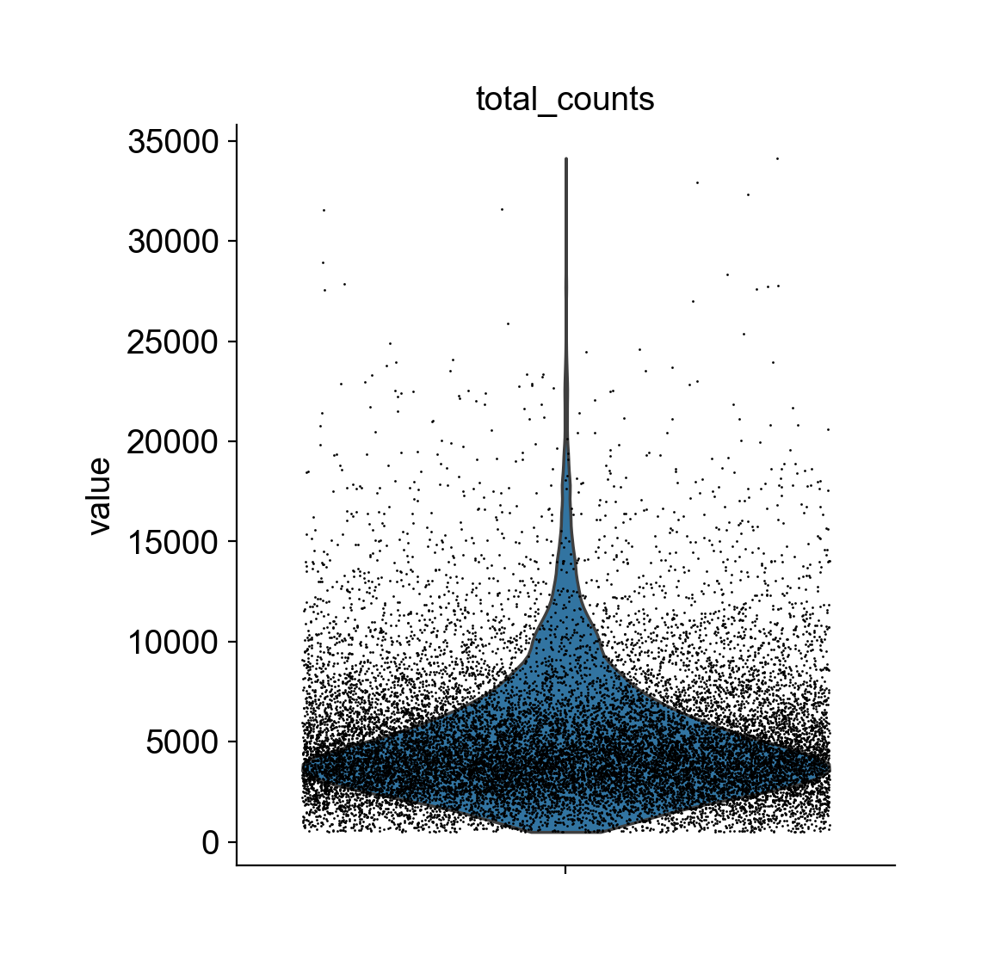

In [37]:
# Make histograms of `nCount_RNA` and `nFeature_RNA` for both datasets (both in obs)
white_plotting()    
sc.pl.violin(adata, ['total_counts'], jitter=0.4, multi_panel=True)

In [38]:
# Normalize total counts per cell
sc.pp.normalize_total(adata, target_sum=1e4) # Obir value 
print("Normalizing total counts per cell")

# Log-transform the data
sc.pp.log1p(adata)  
print("Log-transforming data")

Normalizing total counts per cell
Log-transforming data


In [185]:
1e4

10000.0

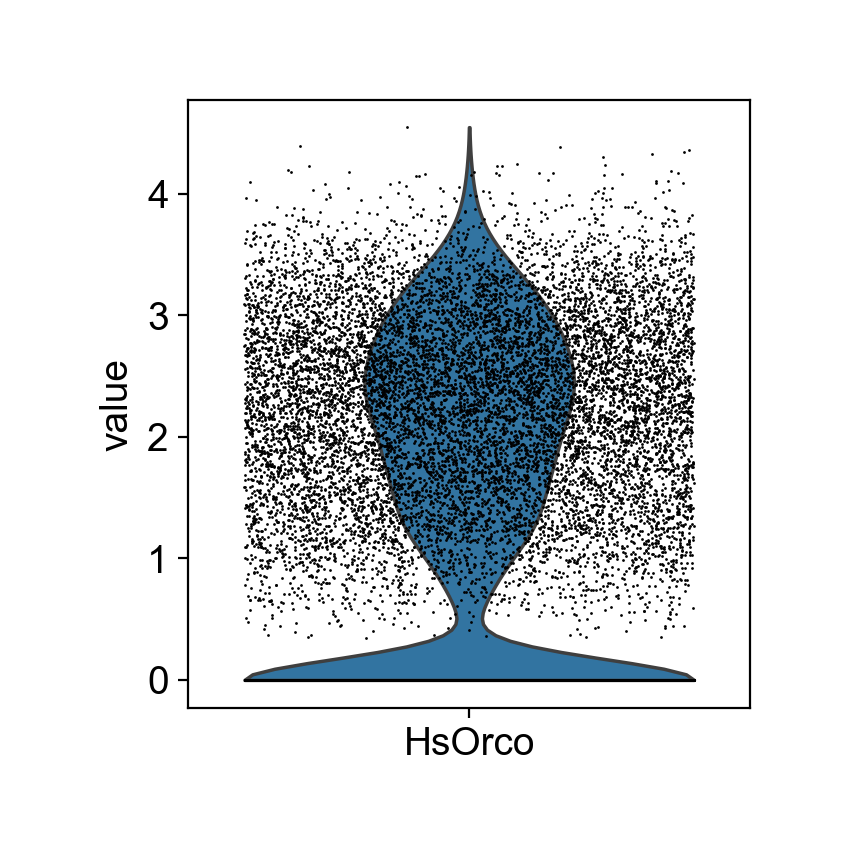

Number of cells with zero Orco expression: 5304


In [39]:
# Plot Orco expression as a violin 
white_plotting()
sc.pl.violin(adata, ['HsOrco'], jitter=0.4)
# Print how many cells have zero Orco 
print(f"Number of cells with zero Orco expression: {sum(adata[:, 'HsOrco'].X.toarray().flatten() == 0)}")

In [40]:
# PCA 
sc.pp.pca(adata) 
print("Performed PCA")

Performed PCA


In [41]:
# Scanorama integration
sce.pp.scanorama_integrate(adata, key="sample")
print("Integrated data with Scanorama, results stored in adata.obsm['X_scanorama']")

[[0.         0.90274983 0.66130114]
 [0.         0.         0.95105616]
 [0.         0.         0.        ]]
Processing datasets 1 <=> 2
Processing datasets 0 <=> 1
Processing datasets 0 <=> 2
Integrated data with Scanorama, results stored in adata.obsm['X_scanorama']


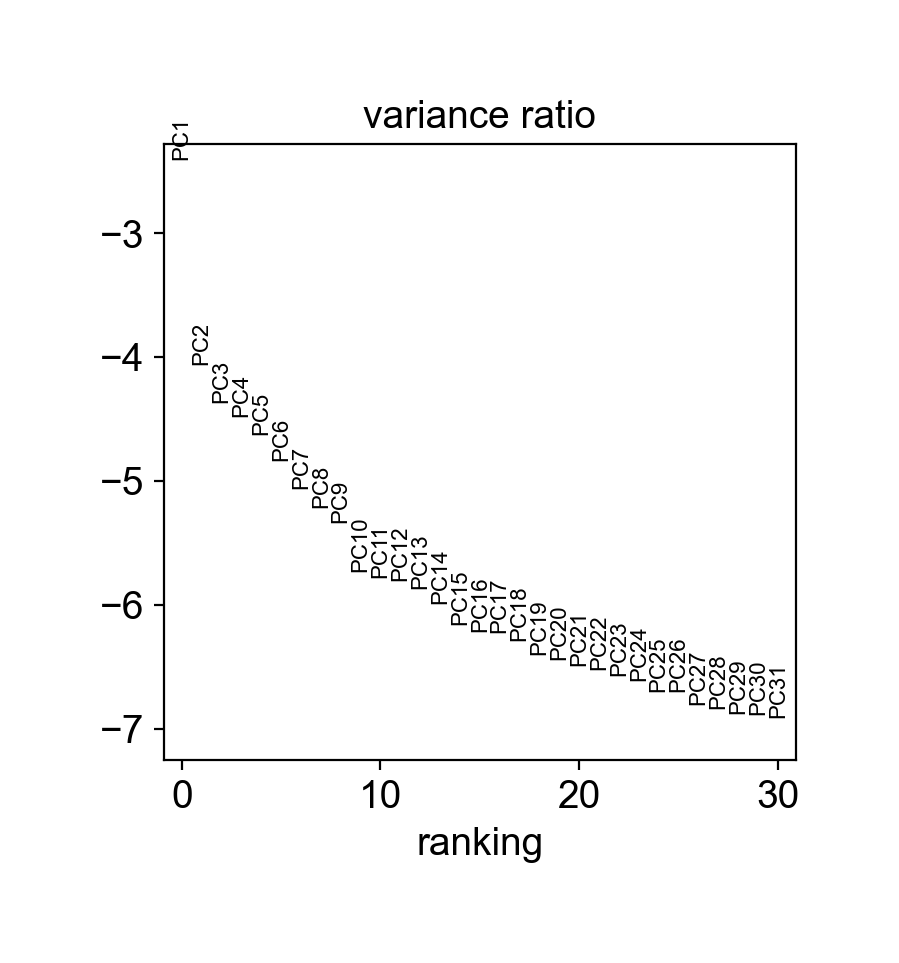

In [42]:
# Plot variance vs PCs 
white_plotting()
sc.pl.pca_variance_ratio(adata, log=True)

In [43]:
sc.pp.highly_variable_genes(adata, min_mean=0.001, max_mean=5, min_disp=0.5)

In [44]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=30, use_rep="X_scanorama")
print("Computed neighborhood graph")

Computed neighborhood graph


In [45]:
sc.tl.umap(adata) 
print("Computed UMAP")

Computed UMAP


In [46]:
sc.tl.leiden(adata, resolution=0.5) 
print("Performed Leiden clustering")

Performed Leiden clustering


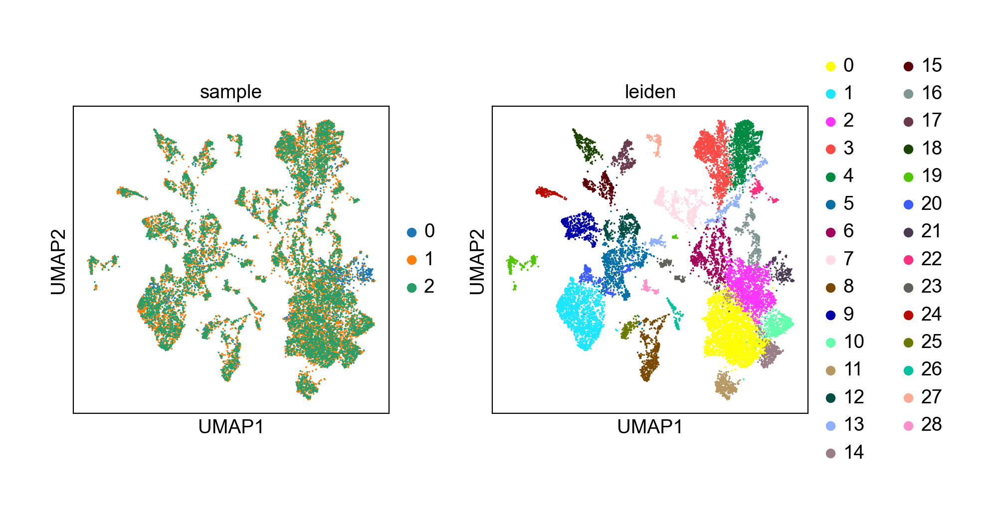

In [47]:
# Verify the three batches were well integrated 
white_plotting()
sc.pl.umap(adata, color=["sample", "leiden"])

## Plot Marker Genes

In [56]:
# Marker Gene DF 
# OSN: HsOrco 
# Neuron: Nsyb - LOC105189534
# Ammonia Sensory: Rh50 - LOC105188823
# Mechanosensory: NompC - LOC105188598
# Glia: Repo - LOC105181500 
# Muscle: MHC - LOC105191850
# Epithelium: GRH - LOC105181616
# Neural Support Cells: Sv - LOC105187024

marker_genes = ["LOC105189534", "HsOrco", "LOC105188598", "LOC105181500", "LOC105191850", "LOC105181616", "LOC105187024"]
marker_clusters = ["Neuron", "OSN", "Mechanosensory", "Glia", "Muscle", "Epithelium", "Neural Support Cells"]
marker_gene_df = pd.DataFrame({"cluster": marker_clusters, "gene": marker_genes})
marker_gene_df

,cluster,gene
0,Neuron,LOC105189534
1,OSN,HsOrco
2,Mechanosensory,LOC105188598
3,Glia,LOC105181500
4,Muscle,LOC105191850
5,Epithelium,LOC105181616
6,Neural Support Cells,LOC105187024


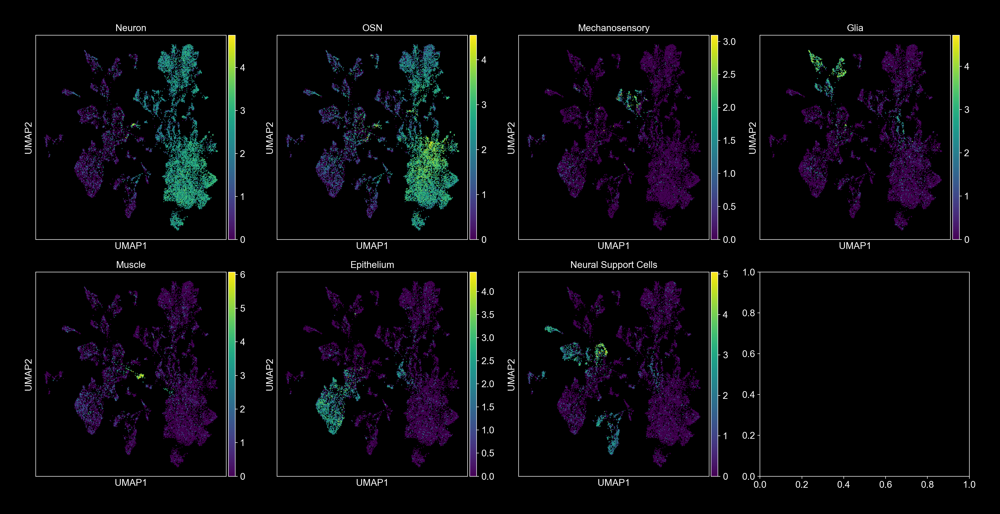

In [57]:
# Plot Marker Genes UMAPs 
black_plotting() 
f, ax = plt.subplots(2, 4, figsize=(20, 10))
for i, gene in enumerate(marker_genes):
    sc.pl.umap(adata, color=gene, ax=ax.flatten()[i], show=False, legend_loc="on data", title=marker_clusters[i], cmap="viridis")
plt.tight_layout()
plt.show()

## Unsupervised Bubble Plot

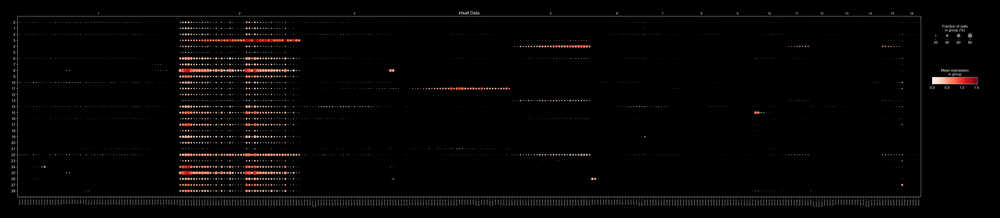

In [58]:
# Convert ta_size to int 
or_db["ta_size"] = or_db["ta_size"].astype(int)
# Sort by tandem array size
or_db_sorted = or_db.sort_values(by=['ta_size'])
# Remove TAs with size less than 3 
or_db_sorted_subset = or_db_sorted[or_db_sorted['ta_size'] > 5]
# Create a dictionary of TAs to ORs
ta_to_ors = or_db_sorted_subset.groupby('tandem_array')['gene_name'].apply(list).to_dict()

# Sort each list of ORs by start position
for ta, ors in ta_to_ors.items():
    ta_to_ors[ta] = sorted(ors, key=lambda x: or_db.loc[or_db.gene_name == x, 'start'].values[0])

# Convert keys to string 
ta_to_ors = {str(k): v for k, v in ta_to_ors.items()}

# Plot bubble plot of P1 clusters vs genes 
black_plotting()
f, ax = plt.subplots(1, 1, figsize=(50, 10))
dp = sc.pl.dotplot(adata, ta_to_ors, groupby="leiden", ax=ax, show=False)

ax = dp["mainplot_ax"]
# Loop through ticklabels and make them italic
for l in ax.get_xticklabels():
    l.set_size(5)

# Adjust the fontsize of the top labels 
group_ax = dp["gene_group_ax"]  # This is the axis for the grouping variable labels

# Adjust the font size of the group labels
for text in group_ax.texts:  # group_ax.texts holds the text objects for the group labels
    text.set_fontsize(10) 

# Add ylabel 
ax.set_title("Hsalt Data")

# Adjust spacing of axes so that size_legend_ax and color_legend_ax are visible 
dp['mainplot_ax'].set_position([0.1, 0.1, 0.8, 0.8])  # Shrink mainplot_ax width to 0.6
dp['gene_group_ax'].set_position([0.1, 0.85, 0.8, 0.05])  # Align gene_group_ax with mainplot_ax

dp["size_legend_ax"].set_position([0.91, 0.8, 0.04, 0.05])  # Position size legend
dp["color_legend_ax"].set_position([0.91, 0.6, 0.04, 0.03])  # Position color legend

plt.show()

## Drop Rows from or_db not in data 

In [49]:
or_db['in_data'] = or_db['gene_name'].isin(adata.var_names)
or_db  = or_db[or_db['in_data']]

## Save Tandem Array to Data

In [50]:
# Tandem array based assignment
tandem_array_matrix = pd.DataFrame(0, index=adata.obs_names, columns=or_db['tandem_array'].unique().astype(str))
for array in or_db['tandem_array'].unique():
    tandem_array_matrix[array] = adata[:, or_db[or_db['tandem_array'] == array]['gene_name']].X.sum(axis=1)

# Add the tandem array matrix to the data 
adata.obsm['tandem_array'] = tandem_array_matrix.values

# Assign clusters to cells based on the tandem array with the highest expression
adata.obs['tandem_array_cluster'] = tandem_array_matrix.idxmax(axis=1).values.astype(str) 

## Bubble Plot of Tandem Array Clusters vs ORs

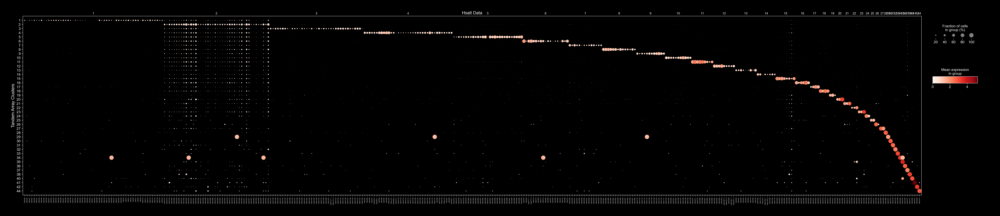

In [61]:
# Convert ta_size to int 
or_db["ta_size"] = or_db["ta_size"].astype(int)
# Sort by tandem array size
or_db_sorted = or_db.sort_values(by=['ta_size'])
# Remove TAs with size less than 3 
or_db_sorted_subset = or_db_sorted[or_db_sorted['ta_size'] > 0]
# Create a dictionary of TAs to ORs
ta_to_ors = or_db_sorted_subset.groupby('tandem_array')['gene_name'].apply(list).to_dict()
# Convert keys to string 
ta_to_ors = {str(k): v for k, v in ta_to_ors.items()}

# Plot bubble plot of P1 clusters vs genes 
black_plotting()
f, ax = plt.subplots(1, 1, figsize=(50, 10))
dp = sc.pl.dotplot(adata, ta_to_ors, groupby="tandem_array_cluster", ax=ax, show=False)

ax = dp["mainplot_ax"]
# Loop through ticklabels and make them italic
for l in ax.get_xticklabels():
    l.set_size(5)

# Adjust the fontsize of the top labels 
group_ax = dp["gene_group_ax"]  # This is the axis for the grouping variable labels

# Adjust the font size of the group labels
for text in group_ax.texts:  # group_ax.texts holds the text objects for the group labels
    text.set_fontsize(10) 

# Add ylabel 
ax.set_ylabel('Tandem Array Clusters')
ax.set_title("Hsalt Data")

# Adjust spacing of axes so that size_legend_ax and color_legend_ax are visible 
dp['mainplot_ax'].set_position([0.1, 0.1, 0.8, 0.8])  # Shrink mainplot_ax width to 0.6
dp['gene_group_ax'].set_position([0.1, 0.85, 0.8, 0.05])  # Align gene_group_ax with mainplot_ax

dp["size_legend_ax"].set_position([0.91, 0.8, 0.04, 0.05])  # Position size legend
dp["color_legend_ax"].set_position([0.91, 0.6, 0.04, 0.03])  # Position color legend

plt.show()

## Ladder Example

In [51]:
or_db

,gene_name,gene_number,scaffold,start,end,strand,n_exons,nine_exon,rank,tandem_array,ta_size,ta_index,ta_strand,in_data
0,HsOr44,44.0,NW_020229890.1,1212870.0,1216852.0,-,7.0,False,0,1,58,0.0,-,True
1,HsOr45,45.0,NW_020229890.1,1218489.0,1221077.0,-,5.0,False,1,1,58,1.0,-,True
2,HsOr46,46.0,NW_020229890.1,1221616.0,1225747.0,-,7.0,False,2,1,58,2.0,-,True
3,HsOr47,47.0,NW_020229890.1,1227302.0,1229819.0,-,5.0,False,3,1,58,3.0,-,True
4,HsOr48,48.0,NW_020229890.1,1233006.0,1235746.0,-,6.0,False,4,1,58,4.0,-,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,HsOr207,207.0,NW_020230682.1,876755.0,880643.0,+,5.0,False,370,16,6,1.0,+,True
369,HsOr206,206.0,NW_020230682.1,881680.0,884301.0,+,4.0,False,371,16,6,2.0,+,True
370,HsOr205,205.0,NW_020230682.1,892748.0,897334.0,+,4.0,False,372,16,6,3.0,+,True
371,HsOr204,204.0,NW_020230682.1,900916.0,905034.0,+,5.0,False,373,16,6,4.0,+,True


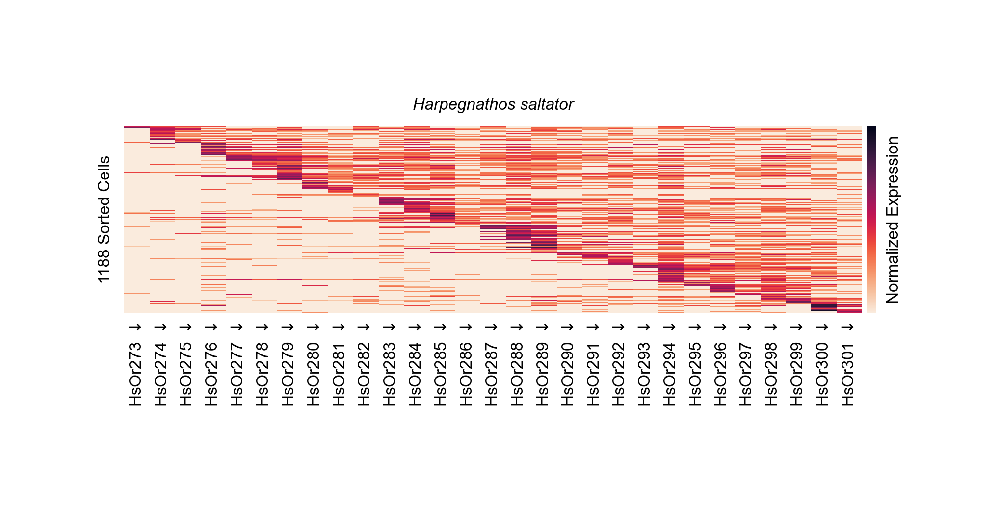

In [120]:
TA = 5

subset = or_db[or_db.tandem_array == TA]
genes = subset.gene_name.values
cells = adata[adata.obs['tandem_array_cluster'] == str(TA)]
expression = pd.DataFrame(cells[:, genes].X.toarray(), columns=genes, index=cells.obs_names)
expression['top_or'] = expression.idxmax(axis=1)
expression['top_or'] = pd.Categorical(expression['top_or'], categories=genes, ordered=True)
expression = expression.sort_values('top_or', ascending=True)

# Plot a heatmap of the expression data, with or_db gene order on the x axis and expression on the y axis
white_plotting()
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
fig, ax = plt.subplots(1, 1, figsize=(5, 2), dpi=200)
sns.heatmap(expression.iloc[:, :-1], 
            cmap=sns.color_palette("rocket_r", as_cmap=True), 
            ax=ax, 
            xticklabels=True, 
            yticklabels=False, 
            cbar_kws={'pad': 0.005}
            )

cbar = ax.collections[0].colorbar
cbar.set_ticks([])
cbar.set_label('Normalized Expression', fontsize=6) 

ax.set_ylabel(f'{cells.shape[0]} Sorted Cells', fontsize=6)
ax.set_xlabel('')
#ax.set_title(f'Tandem Array {TA} Expression (Harpegnathos saltator)', fontsize=6)
# italic 
ax.set_title(f'Harpegnathos saltator', fontsize=6, style='italic')

# Modify the x-tick labels: Remove Or5- prefix and add orientation
xticks = ax.get_xticks()
xticklabels = [x.get_text() for x in ax.get_xticklabels()]
xticklabels = [f"{x} {tr.get_gene(x).strand}" for x in xticklabels]
#xticklabels = [f"{tr.get_gene(x).strand}" for x in xticklabels]
#xticklabels = [re.sub('HsOr','OR',x) for x in xticklabels]
xticklabels = [re.sub(r'(-)', r'$\\uparrow$', x) for x in xticklabels]
xticklabels = [re.sub(r'(\+)', r'$\\downarrow$', x) for x in xticklabels]
ax.set_xticklabels(xticklabels)
plt.xticks(rotation=90, fontsize=6)
# hide x ticks 
ax.xaxis.set_ticks_position('none')

ax.tick_params(axis='x', which='major', pad=0)
ax.grid(False)

plt.tight_layout()
plt.savefig(f"/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/lncRNA Paper/figure_pdfs/Hsalt-T5-staircase.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)

plt.show()

In [117]:
expression.columns.shape

(30,)

## Coexpression

In [121]:
# Make a dataframe with cell ID in a column and individual columns for each OR 
cell_or_expression = pd.DataFrame(index=adata.obs.index, columns=or_db.gene_name)
for i, row in or_db.iterrows(): 
    cell_or_expression[row.gene_name] = adata[:,row['gene_name']].X.toarray().flatten()

In [122]:
# Sort by nine_exon 
or_db['ta_size'] = or_db['ta_size'].astype(int)
or_db = or_db.sort_values(by=['ta_size'])
all_TAs = or_db[or_db['ta_size']>4]['tandem_array'].unique()

# Make a matrix to store the counts of coexpression between each pair of TAs
TA_coexpression_counts = np.zeros((len(all_TAs), len(all_TAs)))
for i, TA_1 in enumerate(all_TAs): 
    for j, TA_2 in enumerate(all_TAs):
        if i > j: 
            # Get the ORs in TA1 and TA2
            ORs_TA_1 = or_db.loc[or_db.tandem_array == TA_1, 'gene_name'] 
            ORs_TA_2 = or_db.loc[or_db.tandem_array == TA_2, 'gene_name'] 

            # Get the number of cells expressing ORs from TA1 and TA2 
            num_cells_TA1 = cell_or_expression.loc[(cell_or_expression[ORs_TA_1] > 0).any(axis=1)].shape[0] 
            num_cells_TA2 = cell_or_expression.loc[(cell_or_expression[ORs_TA_2] > 0).any(axis=1)].shape[0] 

            # Get the number of cells expressing ORs from both TA1 and TA2
            num_cells_TA1_and_TA2_p1 = cell_or_expression.loc[(cell_or_expression[ORs_TA_1] > 0).any(axis=1) & (cell_or_expression[ORs_TA_2] > 0).any(axis=1)].shape[0] 
            TA_coexpression_counts[i, j] = num_cells_TA1_and_TA2_p1 / (num_cells_TA1 + num_cells_TA2 - num_cells_TA1_and_TA2_p1)


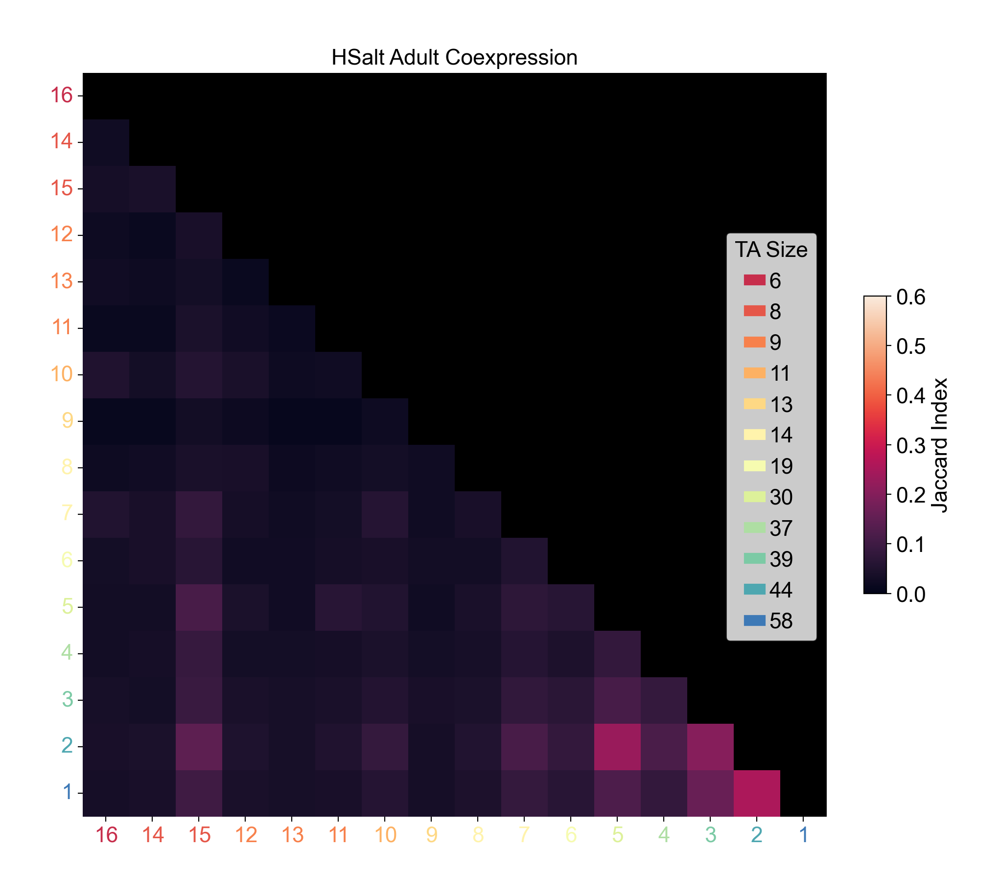

In [66]:
# Plot the heatmap
f, ax = plt.subplots(1, 1, figsize=(10, 10))
fontsize = 16

# Load the original 'rocket' colormap
original_cmap = sns.color_palette("rocket", as_cmap=True)

# Create a new colormap with black as the first color
colors = [(0, 0, 0)] + [original_cmap(i) for i in range(256)]  # Start with black
custom_cmap = LinearSegmentedColormap.from_list("modified_rocket", colors)

sns.heatmap(
    TA_coexpression_counts, 
    ax=ax, 
    vmin=0, vmax=0.6, cmap=custom_cmap, square=True, 
    xticklabels=all_TAs, yticklabels=all_TAs, cbar=False
)
ax.set_title('HSalt Adult Coexpression', fontsize=fontsize)

# Create a ScalarMappable for the colorbar
sm = plt.cm.ScalarMappable(cmap='rocket', norm=plt.Normalize(vmin=0, vmax=0.6))

# Add an inset axis to place the colorbar
cbar_ax = ax.inset_axes([1.05, 0.3, 0.03, 0.4])  # Adjust [x, y, width, height] for placement
cbar = plt.colorbar(sm, cax=cbar_ax, orientation='vertical')
cbar.set_label('Jaccard Index', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

# Assign colors for each chromosome 
all_TAs_size = [or_db[or_db['tandem_array'] == TA1]['ta_size'].values[0] for TA1 in all_TAs]
unique_sizes = sorted(set(all_TAs_size))
colors = sns.color_palette("Spectral", len(unique_sizes))
color_dict = dict(zip(unique_sizes, colors))

xticks = ax.get_xticklabels()
yticks = ax.get_yticklabels()
for i, (xtick, ytick) in enumerate(zip(xticks, yticks)):
    color = color_dict[all_TAs_size[i]]
    xtick.set_color(color)
    ytick.set_color(color)
ax.tick_params(axis='x', labelsize=fontsize, rotation=0)
ax.tick_params(axis='y', labelsize=fontsize, rotation=0)

# Add legend
legend_elements = [Line2D([0], [0], color=color, lw=8, label=label)
                   for label, color in color_dict.items()]
ax.legend(
    handles=legend_elements, 
    title='TA Size',
    fontsize=fontsize, 
    title_fontsize=fontsize,
    bbox_to_anchor=(0.85, 0.8), 
    loc='upper left'
)

plt.show()

## Ranked TA Data 
- Make one single dataframe per dataset containing expression data for all cells 
- For each cell, sort the ORs by expression, then map the ORs to tandem arrays, then take the top 10 **unique** highest-expressing TAs 
- For each TA, save not only the expression of hte highest-expressing OR, but also the expression of the other ORs in the tandem array 
- Save the index of the OR in the TA relative to the highest-expressing valence OR in `ta_index_rel`
- Save the rank of the TA in `ta_rank` 
- Save the expression of each OR in each cell in `expression` 
- Save the cell ID in `cell_index` 
- Exclude T72 which includes Orco 

In [67]:
results_list = []  # Use a list to collect results efficiently

max_TAs = 10 # Number of top TAs to consider

# Precompute OR-to-Tandem Array and OR-to-TA Index mappings
or_db = or_db.sort_values(by=['scaffold', 'start'])
or_to_ta = or_db.set_index('gene_name')['tandem_array'].to_dict()
or_to_ta_index = or_db.set_index('gene_name')['ta_index'].to_dict()
or_to_strand = or_db.set_index('gene_name')['strand'].to_dict()

# Iterate over cells
for cell in tqdm(cell_or_expression.index, desc='Processing Hsalt Cells'):
    # Get the ORs sorted by expression
    cell_expression = cell_or_expression.loc[cell]
    
    # get nonzero expression 
    cell_expression_nonzero = cell_expression[cell_expression > 0]

    # nonzero ORs sorted by expression, descending, top to bottom 
    ORs_sorted = cell_expression_nonzero.sort_values(ascending=False).index.values

    # Remove Or5-Orco 
    ORs_sorted = ORs_sorted[ORs_sorted != 'HsOrco']

    # Map ORs to Tandem Arrays and filter for valid entries
    TAs_sorted = pd.Series([or_to_ta[or_] for or_ in ORs_sorted])

    # Get unique TAs while preserving order 
    # pd.unique preserves order
    TAs_sorted_unique = pd.unique(TAs_sorted)

    # Get the top max_TAs TAs if there are more than max_TAs
    TAs_sorted_unique_top = TAs_sorted_unique[:max_TAs]

    # Get the highest expressing OR for each unique TA 
    valence_ORs = [ORs_sorted[np.where(TAs_sorted == TA)[0][0]] for TA in TAs_sorted_unique_top]

    # Process each top OR
    for i, or_ in enumerate(valence_ORs):
        or_index = or_to_ta_index[or_]
        or_TA = or_to_ta[or_]
        or_strand_multiplier = -1 if or_to_strand[or_] == "-" else 1

        # Filter Tandem Array ORs
        TA_ORs = or_db[or_db['tandem_array'] == or_TA].copy()
        TA_ORs['ta_index_rel'] = TA_ORs['ta_index'] - or_index  # Adjust TA indices relative to the top OR
        TA_ORs['ta_index_rel'] = TA_ORs['ta_index_rel'] * or_strand_multiplier # Invert the indices if strand is "-" 
        
        # Add expression values and cell information
        TA_ORs['expression'] = cell_expression[TA_ORs['gene_name']].values
        TA_ORs['cell_index'] = cell
        TA_ORs['ta_rank'] = i

        # sort by relative order 
        TA_ORs = TA_ORs.sort_values(by='ta_index_rel', ascending=True).reset_index(drop=True)

        # Append relevant columns to the results list
        
        results_list.append(
            TA_ORs[['cell_index', 'ta_rank', 'tandem_array', 'gene_name', 'ta_index_rel', 'expression', 'strand', 'ta_size', 'ta_index']]
        )

# Combine all results into a DataFrame
results = pd.concat(results_list, ignore_index=True)
results.ta_index_rel = results.ta_index_rel.astype(int)

Processing Hsalt Cells: 100%|██████████| 17802/17802 [00:46<00:00, 384.79it/s]


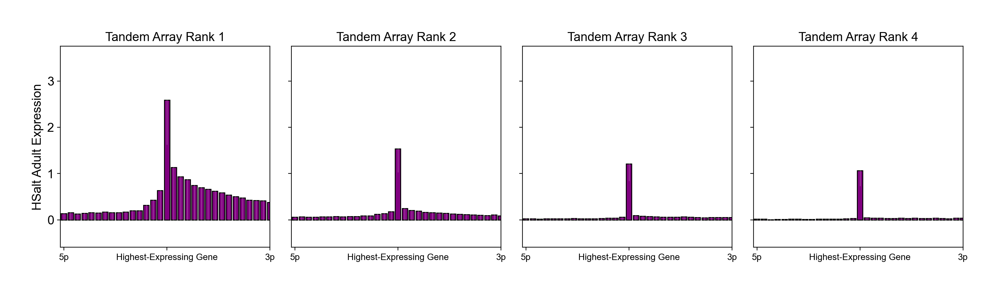

In [68]:
# Make 3 subplots, plotting ta_rank 0-2, average expression for each ta_index (only plot -10 to +10) 
num_TAs = 4
num_ORs = 15
f, ax = plt.subplots(1, num_TAs, figsize=(15, 4), sharey=True, sharex=True)
ax = ax.flatten()
for i in range(num_TAs):
    # Plot P1 
    ta_results = results[results['ta_rank'] == i]
    ta_results = ta_results[(ta_results['ta_index_rel'] >= -num_ORs) & (ta_results['ta_index_rel'] <= num_ORs)]
    sns.barplot(data=ta_results, x='ta_index_rel', y='expression', ax=ax[i], errcolor='white', facecolor='purple', edgecolor='black', ci='sd', errwidth=0.2)
    ax[i].set_title(f'Tandem Array Rank {i+1}')
    ax[i].set_xlabel('')
    ax[i].tick_params(axis='x', labelsize=10)

    # Set xticks to 5p, 0, and 3p 
    ax[i].set_xticks([0, num_ORs, 2*num_ORs])
    ax[i].set_xticklabels(['5p', 'Highest-Expressing Gene', '3p'])

ax[0].set_xlabel('')
ax[0].set_ylabel('HSalt Adult Expression')
plt.tight_layout()
plt.show()

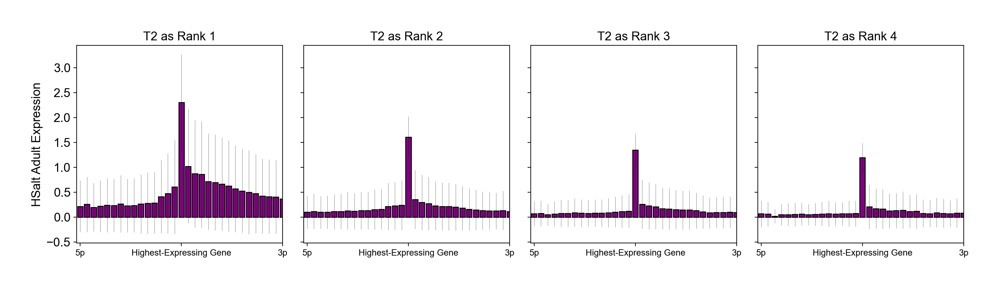

In [69]:
# Only T2 (T17 ortholog)
num_TAs = 4
num_ORs = 15
f, ax = plt.subplots(1, num_TAs, figsize=(15, 4), sharey=True, sharex=True)
white_plotting()
ax = ax.flatten()
for i in range(num_TAs):
    # Plot P1 
    ta_results = results[(results['ta_rank'] == i) & (results['tandem_array'] == 2)]
    ta_results = ta_results[(ta_results['ta_index_rel'] >= -num_ORs) & (ta_results['ta_index_rel'] <= num_ORs)]
    sns.barplot(data=ta_results, x='ta_index_rel', y='expression', ax=ax[i], errcolor='black', facecolor='purple', edgecolor='black', ci='sd', errwidth=0.2)
    ax[i].set_title(f'T2 as Rank {i+1}')
    ax[i].set_xlabel('')
    ax[i].tick_params(axis='x', labelsize=10)

    # Set xticks to 5p, 0, and 3p 
    ax[i].set_xticks([0, num_ORs, 2*num_ORs])
    ax[i].set_xticklabels(['5p', 'Highest-Expressing Gene', '3p'])

ax[0].set_xlabel('')
ax[0].set_ylabel('HSalt Adult Expression')
plt.tight_layout()
plt.show()

#### Calculate the proportion of cells expressing from TA with rank > 1 
- Normalize by the number of cells in each dataset 
- Exclude ta_rank 0 (valence OR tandem array) 
- Exclude small TAs 
- Order by TA size

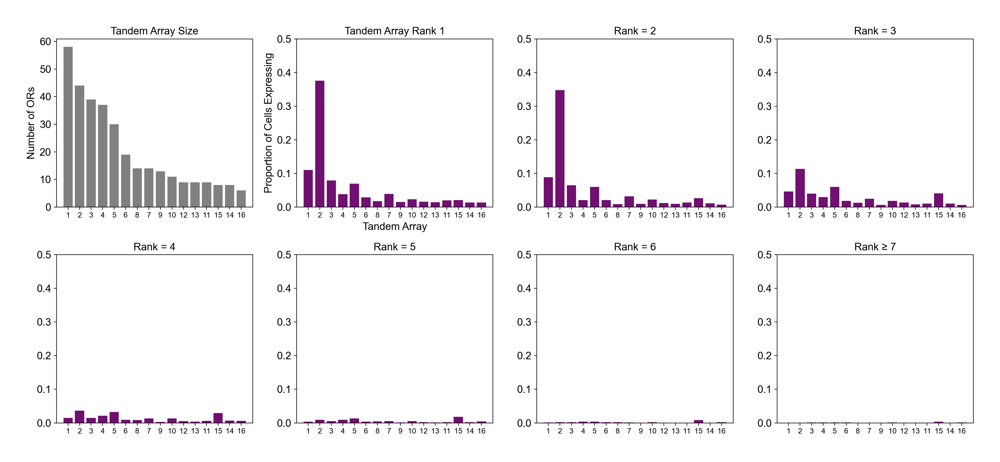

In [70]:
# Plot large TAs on x, plot # cells expressing from that TA with rank 2 on y, color by P1 and P14
or_db_sorted = or_db.sort_values(by='ta_size', ascending=False)
large_TAs = or_db_sorted[or_db_sorted['ta_size'] > 5]['tandem_array'].unique()

n_cells = results['cell_index'].nunique()

f, ax = plt.subplots(2, 4, figsize=(18, 8))
ax = ax.flatten()

n_ranks = 7

rank_thresholds = np.arange(n_ranks)

for rank_thresh in rank_thresholds: 

    # Filter 
    if rank_thresh < n_ranks - 1: 
        results_filtered = results[(results['tandem_array'].isin(large_TAs)) & (results['ta_rank'] == rank_thresh)]
        ax[rank_thresh+1].set_title(f'Rank = {rank_thresh+1}')
    else: 
        results_filtered = results[(results['tandem_array'].isin(large_TAs)) & (results['ta_rank'] >= rank_thresh)]
        ax[rank_thresh+1].set_title(f'Rank ≥ {rank_thresh+1}')

    # Get the number of cells expressing from each TA
    num_cells = results_filtered.groupby(['tandem_array'])['cell_index'].nunique().reset_index()

    # Rename the column
    num_cells = num_cells.rename(columns={'cell_index': 'num_cells'})

    # Divide by the total number of cells to get the proportion
    num_cells['num_cells'] = num_cells['num_cells'] / n_cells

    # Add the TA size to the dataframe
    num_cells['ta_size'] = num_cells['tandem_array'].apply(lambda x: or_db.loc[or_db['tandem_array'] == x, 'ta_size'].values[0])

    # Sort 
    num_cells = num_cells.sort_values(by=['ta_size', 'tandem_array'])

    # Bar plot of num_cells vs tandem_array, Group hue 
    sns.barplot(data=num_cells, x='tandem_array', y='num_cells', palette=['purple'], order=large_TAs, ax=ax[rank_thresh+1], legend=None)
    ax[rank_thresh+1].set_xlabel('')
    ax[rank_thresh+1].set_ylabel('')
    ax[rank_thresh+1].tick_params(axis='x', labelsize=10)
    ax[rank_thresh+1].set_xlim(-1, len(large_TAs))
    ax[rank_thresh+1].set_ylim(0, 0.5)

# Plot ta_size vs tandem_array on first plot
sns.barplot(data=num_cells, x='tandem_array', y='ta_size', color='grey', ax=ax[0], order=large_TAs)
ax[0].set_xlabel('')
ax[0].set_ylabel('Number of ORs')
ax[0].tick_params(axis='x', labelsize=10)
ax[0].set_xlim(-1, len(large_TAs))
ax[0].set_title("Tandem Array Size")

# Add legend to first plot
ax[1].set_title('Tandem Array Rank 1')
ax[1].set_ylabel('Proportion of Cells Expressing')
ax[1].set_xlabel('Tandem Array')

plt.tight_layout()
plt.show()

## HSalt T2 is only partially nine-exon

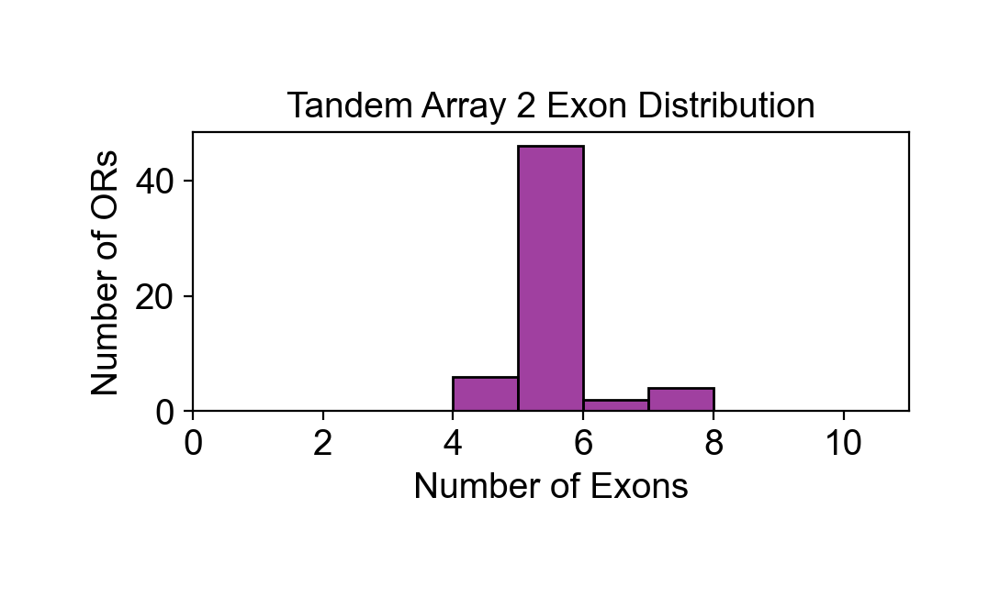

In [71]:
# Is tandem array 9E? 
t2_exons = or_db[or_db.tandem_array == 1]['n_exons']
# Plot histogram of t2_exons
f, ax = plt.subplots(1, 1, figsize=(5, 2))
sns.histplot(t2_exons, ax=ax, bins=range(1, 15), color='purple', kde=False)
ax.set_xlabel('Number of Exons')
ax.set_ylabel('Number of ORs')
ax.set_title('Tandem Array 2 Exon Distribution')
#ax.set_xticks([6, 7, 8, 9, 10, 11])
ax.set_xlim(0, 11)
plt.show()

## Histograms of Probability of Each OR Being the Top OR 

Theoretical Probability: 0.002688172043010753
Identified 370 Valence ORs


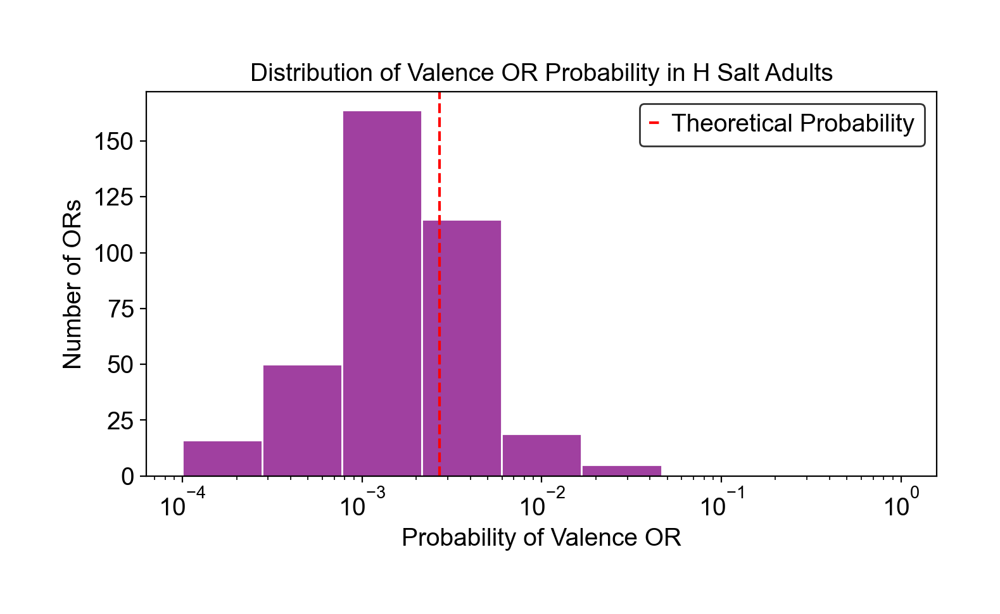

In [72]:
plt.figure(figsize=(8, 4))

# Calculate theoretical probability 
total_ORs = or_db.shape[0]
prob = 1 / total_ORs
print(f"Theoretical Probability: {prob}")
# plot line
plt.axvline(x=prob, color='red', linestyle='--', label='Theoretical Probability')

# Make bins 
#bins = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1] 
bins = np.logspace(-4, 0, 10)


# P1 
ta_results = results[(results['ta_index_rel'] == 0) & (results['ta_rank'] == 0)] # Valence ORs of Top TA 
genes, counts = ta_results['gene_name'].value_counts().index, ta_results['gene_name'].value_counts().values
counts = counts / counts.sum()
print(f"Identified {len(genes)} Valence ORs")
sns.histplot(data=counts, color='purple', bins=bins, edgecolor='white', linewidth=1)

plt.xlabel('Probability of Valence OR') 
plt.xscale('log')
plt.ylabel('Number of ORs')
plt.legend()
plt.title('Distribution of Valence OR Probability in H Salt Adults')
plt.show()

## Assess Spread Across the TA 

In [73]:
# ta_index_2 represents distance from the 5' end of the tandem array 
results['dist_5p'] = results.apply(lambda x: x['ta_size'] - x['ta_index'] + 1 if x['strand'] == '-' else x['ta_index'], axis=1)

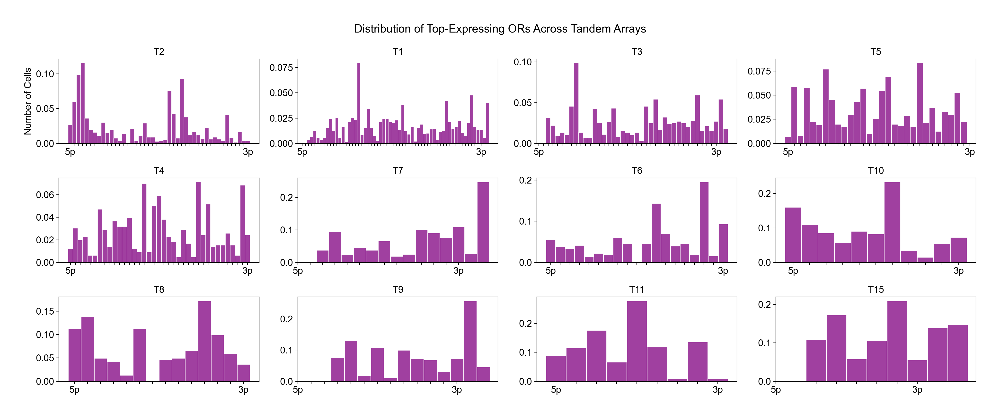

In [74]:
# For each tandem array, plot the distribution of dist_5p where ta_index_rel is 0 
# Get a list of TAs sorted by size 
top_12_tas = results[results['ta_rank'] == 0]['tandem_array'].value_counts().index[:12]

f, ax = plt.subplots(3, 4, figsize=(20, 8))
ax = ax.flatten()
for i, TA in enumerate(top_12_tas):
    ta_results = results[(results['tandem_array'] == TA) & (results['ta_index_rel'] == 0) & (results['ta_rank'] == 0)]
    sns.histplot(data=ta_results, x='dist_5p', ax=ax[i], color='purple', edgecolor='white', binwidth=1, discrete=True, stat="probability")
    ta_size = ta_results['ta_size'].iloc[0]
    ax[i].set_xticks(range(ta_size))
    xticklabels = ['5p'] + [''] * (ta_size - 2) + ['3p']
    ax[i].set_xticklabels(xticklabels)
    ax[i].set_title(f'T{TA}')
    ax[i].set_xlabel('')
    ax[i].set_ylabel('')


ax[0].set_ylabel('Number of Cells')
plt.suptitle('Distribution of Top-Expressing ORs Across Tandem Arrays')
plt.tight_layout()
plt.show()

## Look for nested lncRNAs 

In [123]:
all_genes = [tr_ncbi.get_gene(gene) for gene in tr_ncbi.genes.keys() if len(tr_ncbi.get_gene(gene).transcripts) > 0]
all_lncRNAs = [gene for gene in all_genes if gene.transcripts[0].biotype == 'lnc_RNA']
len(all_lncRNAs), len(all_genes)

(1029, 14020)

In [124]:
def overlapping(chr1, start1, end1, chr2, start2, end2):
    return chr1 == chr2 and not (end1 < start2 or end2 < start1)

In [125]:
# Find nested lncRNAs within TAs 
or_db_no_orco = or_db.loc[~or_db.gene_name.str.contains('HsOrco')].reset_index(drop=True)

TAs = or_db_no_orco['tandem_array'].unique()
nested_lncRNAs = [] 

for ta_ in TAs: 
    # Get bounds of tandem array 
    TA_genes = or_db_no_orco.loc[or_db_no_orco['tandem_array'] == int(ta_)]
    # sort by start
    TA_genes = TA_genes.sort_values(by='start').reset_index(drop=True)
    TA_genes = TA_genes['gene_name']
    TA_chromosome = tr.get_gene(TA_genes.iloc[0]).chromosome
    first_gene_bounds = tr.get_gene(TA_genes.iloc[0]).get_transcript_longest_bounds().get_bounds()
    last_gene_bounds = tr.get_gene(TA_genes.iloc[-1]).get_transcript_longest_bounds().get_bounds()
    TA_bounds = [first_gene_bounds[0], last_gene_bounds[1]]
    
    for lncRNA in all_lncRNAs: 
        lnc_start, lnc_end = lncRNA.get_transcript_longest_bounds().get_bounds()
        lnc_strand = lncRNA.strand 
        #if lnc_start >= TA_bounds[0] and lnc_end <= TA_bounds[1] and lncRNA.chromosome == TA_chromosome: 
        if overlapping(TA_chromosome, TA_bounds[0], TA_bounds[1], lncRNA.chromosome, lnc_start, lnc_end):
            lnc_size = lnc_end - lnc_start
            nested_lncRNAs.append({'gene_name': lncRNA.name, 'TA': ta_, 'TA_location': f"{TA_chromosome}:{TA_bounds[0]}-{TA_bounds[1]}", 'lnc_strand': lnc_strand, 'lnc_size': lnc_size, 'lnc_start': lnc_start, 'lnc_end': lnc_end})

nested_lncRNAs = pd.DataFrame(nested_lncRNAs)
nested_lncRNAs

,gene_name,TA,TA_location,lnc_strand,lnc_size,lnc_start,lnc_end
0,LOC112588929,22,NW_020230149.1:99004-318680,+,381,173865,174246
1,LOC112588771,18,NW_020230081.1:324051-351830,-,821,330610,331431
2,LOC105182292,14,NW_020230377.1:785736-1011874,-,899,807054,807953
3,LOC112590470,15,NW_020230679.1:18906-52258,-,820,30558,31378
4,LOC112588178,12,NW_020229948.1:227684-260913,-,892,233470,234362
...,...,...,...,...,...,...,...
10,LOC112589985,4,NW_020230518.1:45837-228988,-,8447,212377,220824
11,LOC109504322,3,NW_020229910.1:510020-673088,+,1260,650648,651908
12,LOC109504323,3,NW_020229910.1:510020-673088,+,1155,659698,660853
13,LOC112589785,2,NW_020230427.1:620807-959418,+,2921,947582,950503


In [126]:
# Remove lncRNAs that are not in the data 
nested_lncRNAs['in_data'] = nested_lncRNAs['gene_name'].isin(adata.var.index)
print(f"Identified {nested_lncRNAs['in_data'].sum()} nested lncRNAs in the data")
nested_lncRNAs = nested_lncRNAs[nested_lncRNAs['in_data']]
nested_lncRNAs.reset_index(drop=True, inplace=True)

Identified 12 nested lncRNAs in the data


Filter for lncRNAs present in both single cell datasets

In [127]:
# Remove lncRNAs that are not in the data 
nested_lncRNAs['in_data'] = nested_lncRNAs['gene_name'].isin(adata.var.index)
nested_lncRNAs = nested_lncRNAs.loc[nested_lncRNAs['in_data']]
nested_lncRNAs = nested_lncRNAs.reset_index(drop=True)
nested_lncRNAs.shape

(12, 8)

Identify the two ORs that flank the lncRNA 

In [128]:
or_db_no_orco = or_db[~or_db['gene_name'].str.contains('Or2')]
or_db_no_orco.shape

(260, 14)

In [129]:
# For each nested lncRNA, find all ORs that are upstream or downstream of the lncRNA TSS within the TA 
lnc_associated_ORs = [] 

for i, row in nested_lncRNAs.iterrows():
    # Get ORs in the TA
    TA_genes = or_db_no_orco.loc[or_db_no_orco['tandem_array'] == int(row.TA), 'gene_name']
    ORs_of_interest = [] 
    # For each gene, check if it is upstream or downstream of the lncRNA
    for gene in TA_genes: 
        gene_obj = tr.get_gene(gene) 
        gene_start, gene_end = gene_obj.get_transcript_longest_bounds().get_bounds()
        gene_strand = gene_obj.strand
        # Verify that the OR and lncRNA are on opposite strands 
        if gene_strand == row.lnc_strand: 
            continue 
        if gene_strand == "-" and row.lnc_strand == "+": 
            if gene_end < row.lnc_start: 
                ORs_of_interest.append([gene, "upstream", row.lnc_start - gene_start, gene_start, gene_end, gene_strand])
            elif gene_start > row.lnc_start: 
                ORs_of_interest.append([gene, "downstream", gene_start - row.lnc_start, gene_start, gene_end, gene_strand])
        elif gene_strand == "+" and row.lnc_strand == "-": 
            if gene_start > row.lnc_start: 
                ORs_of_interest.append([gene, "upstream", gene_start - row.lnc_start, gene_start, gene_end, gene_strand])
            elif gene_end < row.lnc_start: 
                ORs_of_interest.append([gene, "downstream", row.lnc_start - gene_start, gene_start, gene_end, gene_strand])
    
    # save to lnc_associated_ORs
    for or_name, location, distance, or_start, or_end, or_strand in ORs_of_interest:
        lnc_associated_ORs.append({'lncRNA': row.gene_name, 'lncRNA_size': row.lnc_size, 'TA': row.TA, 'or_name': or_name, 'location': location, 'tss2tss': distance, 'lnc_start': row.lnc_start, 'lnc_end': row.lnc_end, 'lnc_strand': row.lnc_strand, 'or_start': or_start, 'or_end': or_end, 'or_strand': or_strand})
    

lnc_associated_ORs = pd.DataFrame(lnc_associated_ORs)
lnc_associated_ORs

,lncRNA,lncRNA_size,TA,or_name,location,tss2tss,lnc_start,lnc_end,lnc_strand,or_start,or_end,or_strand
0,LOC112588178,892,12,HsOr353,upstream,21849,233470,234362,-,255319,257892,+
1,LOC112588178,892,12,HsOr354,upstream,18733,233470,234362,-,252203,255242,+
2,LOC112588178,892,12,HsOr352,upstream,25044,233470,234362,-,258514,260913,+
3,LOC112588179,4222,12,HsOr353,upstream,26294,229025,233247,-,255319,257892,+
4,LOC112588179,4222,12,HsOr354,upstream,23178,229025,233247,-,252203,255242,+
...,...,...,...,...,...,...,...,...,...,...,...,...
161,LOC109504323,1155,3,HsOr139,upstream,96069,659698,660853,+,563629,565532,-
162,LOC109504323,1155,3,HsOr140,upstream,93302,659698,660853,+,566396,568948,-
163,LOC109504323,1155,3,HsOr141,upstream,85736,659698,660853,+,573962,576791,-
164,LOC109504323,1155,3,HsOr134,upstream,117086,659698,660853,+,542612,546147,-


Measure expression of the OR in cells expressing the lncRNA, for both snRNAseq datasets

In [130]:
# For cells that express each lncRNA, measure the expression of the OR 
unique_lncs = lnc_associated_ORs['lncRNA'].unique()
lnc_associated_ORs['OR_coexpression'] = None
for unique_lnc in unique_lncs: 
    lnc_cell_indices = adata[:, unique_lnc].X > 0
    if lnc_cell_indices.sum() == 0: 
        continue
    for i, row in lnc_associated_ORs.loc[lnc_associated_ORs['lncRNA'] == unique_lnc].iterrows(): 
        or_coexpression = adata[lnc_cell_indices, row['or_name']].X.mean()
        lnc_associated_ORs.at[i, 'OR_coexpression'] = or_coexpression if or_coexpression > 0 else 0

lnc_associated_ORs

,lncRNA,lncRNA_size,TA,or_name,location,tss2tss,lnc_start,lnc_end,lnc_strand,or_start,or_end,or_strand,OR_coexpression
0,LOC112588178,892,12,HsOr353,upstream,21849,233470,234362,-,255319,257892,+,1.589072
1,LOC112588178,892,12,HsOr354,upstream,18733,233470,234362,-,252203,255242,+,1.05944
2,LOC112588178,892,12,HsOr352,upstream,25044,233470,234362,-,258514,260913,+,2.350048
3,LOC112588179,4222,12,HsOr353,upstream,26294,229025,233247,-,255319,257892,+,0.819077
4,LOC112588179,4222,12,HsOr354,upstream,23178,229025,233247,-,252203,255242,+,0.666599
...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,LOC109504323,1155,3,HsOr139,upstream,96069,659698,660853,+,563629,565532,-,0.287622
162,LOC109504323,1155,3,HsOr140,upstream,93302,659698,660853,+,566396,568948,-,0.678492
163,LOC109504323,1155,3,HsOr141,upstream,85736,659698,660853,+,573962,576791,-,0.740261
164,LOC109504323,1155,3,HsOr134,upstream,117086,659698,660853,+,542612,546147,-,0.55678


Adjust distances so that upstream is negative and downstream is positive

In [131]:
lnc_associated_ORs['distance_adjusted'] = lnc_associated_ORs.apply(lambda x: x['tss2tss'] if x['location'] == 'downstream' else -x['tss2tss'], axis=1)
lnc_associated_ORs

,lncRNA,lncRNA_size,TA,or_name,location,tss2tss,lnc_start,lnc_end,lnc_strand,or_start,or_end,or_strand,OR_coexpression,distance_adjusted
0,LOC112588178,892,12,HsOr353,upstream,21849,233470,234362,-,255319,257892,+,1.589072,-21849
1,LOC112588178,892,12,HsOr354,upstream,18733,233470,234362,-,252203,255242,+,1.05944,-18733
2,LOC112588178,892,12,HsOr352,upstream,25044,233470,234362,-,258514,260913,+,2.350048,-25044
3,LOC112588179,4222,12,HsOr353,upstream,26294,229025,233247,-,255319,257892,+,0.819077,-26294
4,LOC112588179,4222,12,HsOr354,upstream,23178,229025,233247,-,252203,255242,+,0.666599,-23178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,LOC109504323,1155,3,HsOr139,upstream,96069,659698,660853,+,563629,565532,-,0.287622,-96069
162,LOC109504323,1155,3,HsOr140,upstream,93302,659698,660853,+,566396,568948,-,0.678492,-93302
163,LOC109504323,1155,3,HsOr141,upstream,85736,659698,660853,+,573962,576791,-,0.740261,-85736
164,LOC109504323,1155,3,HsOr134,upstream,117086,659698,660853,+,542612,546147,-,0.55678,-117086


In [132]:
# get unique lncRNAs
lnc_associated_ORs['lncRNA'].unique()

array(['LOC112588178', 'LOC112588179', 'LOC112590016', 'LOC112589800',
       'LOC109503640', 'LOC112589985', 'LOC109504322', 'LOC109504323'],
      dtype=object)

In [133]:
lncRNA = 'LOC109504322'
rows = lnc_associated_ORs.loc[lnc_associated_ORs['lncRNA'] == lncRNA]
upstream_ORs = rows.loc[rows['location'] == 'upstream']['or_name'].values
downstream_ORs = rows.loc[rows['location'] == 'downstream']['or_name'].values
rows

,lncRNA,lncRNA_size,TA,or_name,location,tss2tss,lnc_start,lnc_end,lnc_strand,or_start,or_end,or_strand,OR_coexpression,distance_adjusted
90,LOC109504322,1260,3,HsOr147,upstream,61875,650648,651908,+,588773,592011,-,0.44474,-61875
91,LOC109504322,1260,3,HsOr148,upstream,57436,650648,651908,+,593212,595581,-,0.268143,-57436
92,LOC109504322,1260,3,HsOr149,upstream,54060,650648,651908,+,596588,599450,-,0.424701,-54060
93,LOC109504322,1260,3,HsOr150,upstream,50206,650648,651908,+,600442,603197,-,0.4605,-50206
94,LOC109504322,1260,3,HsOr151,upstream,46696,650648,651908,+,603952,606545,-,0.349407,-46696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,LOC109504322,1260,3,HsOr139,upstream,87019,650648,651908,+,563629,565532,-,0.250663,-87019
124,LOC109504322,1260,3,HsOr140,upstream,84252,650648,651908,+,566396,568948,-,0.643841,-84252
125,LOC109504322,1260,3,HsOr141,upstream,76686,650648,651908,+,573962,576791,-,0.676014,-76686
126,LOC109504322,1260,3,HsOr134,upstream,108036,650648,651908,+,542612,546147,-,0.518841,-108036


Chromosome: NW_020229910.1, Start: 509920, End: 673188


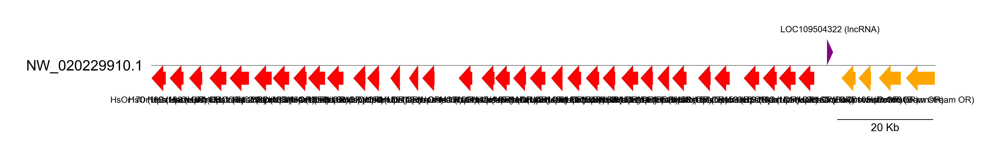

In [134]:
chromosome = tr.get_gene(lncRNA).chromosome
start = min(rows.or_start)-100
end = max(rows.or_end)+100
print(f"Chromosome: {chromosome}, Start: {start}, End: {end}")

white_plotting()
gv = GenomeViz(track_align_type="center", theme="light")
gv.set_scale_bar(ymargin=0.5)

fontsize=12 

# Get bounds 
track = gv.add_feature_track(chromosome, segments = (int(start), int(end)))
#track.add_sublabel(size=fontsize)

# Add gene models to plot 
for gene in [lncRNA] + list(upstream_ORs) + list(downstream_ORs):
    transcript = tr.get_gene(gene).get_transcript_longest_bounds()
    bounds = transcript.get_bounds()
    strand = np.where(transcript.strand == '+', 1, -1) 
    vpos = "top" if strand == 1 else "bottom"
    if gene in upstream_ORs:
        color = 'red'
        label = f'{gene} (Upstream OR)'
    elif gene in downstream_ORs:
        color = 'orange'
        label = f'{gene} (Downstream OR)'
    elif gene == lncRNA: 
        color = 'purple'
        label = f'{gene} (lncRNA)'
    else: 
        color = 'grey'
        label = gene
        
    track.add_feature(
        int(bounds[0]),
        int(bounds[1]), 
        strand, 
        plotstyle='arrow', 
        fc=color, 
        arrow_shaft_ratio = 0.5, 
        label=label, 
        text_kws={'color': 'black', 
                  'rotation': 0, 
                  'vpos': vpos, 
                  'hpos': 'center', 
                  'size':fontsize}
    )

fig = gv.plotfig()
plt.show()

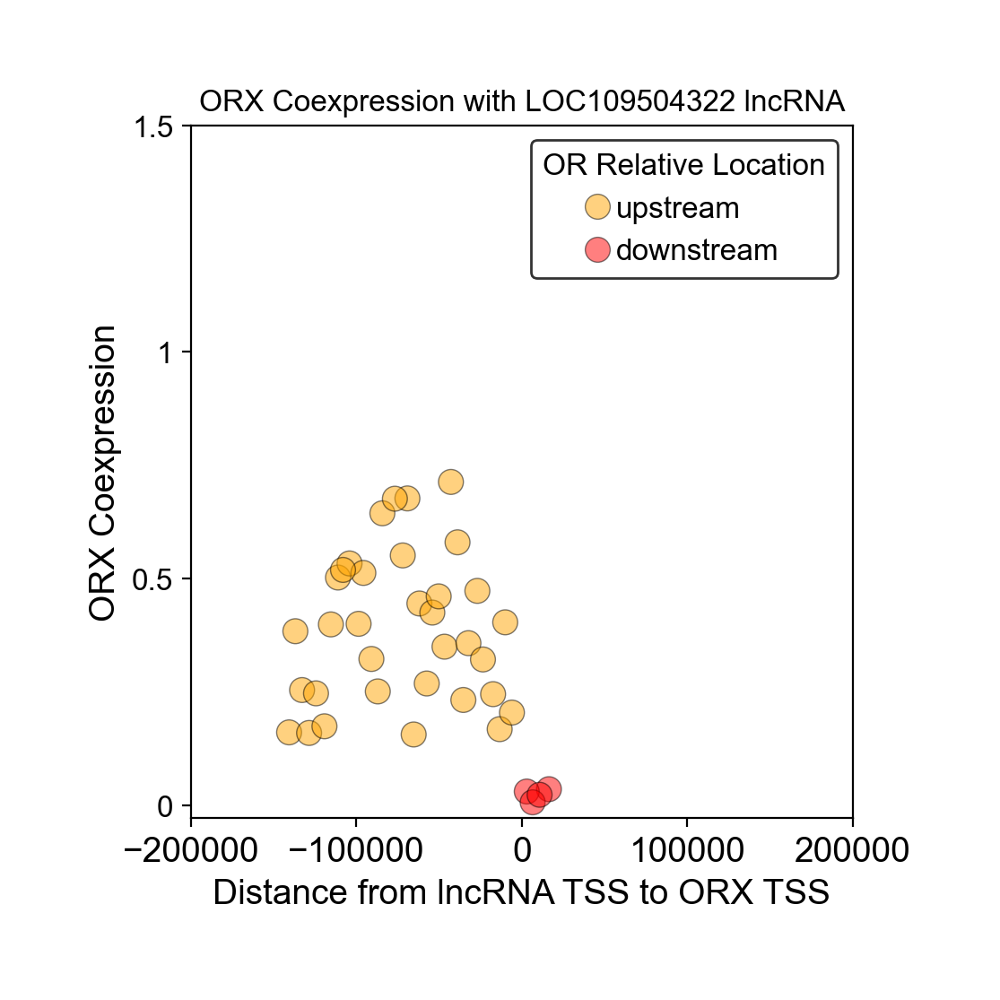

In [135]:
# Scatter plot of coexpression vs distance_adjusted, two subplots for P1 and P14, with KDE 
white_plotting()
fontsize=12
f, ax = plt.subplots(1, 1, figsize=(5, 5), sharey=True)
palette=['orange', 'red']
sns.scatterplot(data=rows, x='distance_adjusted', y="OR_coexpression", ax=ax, hue='location', hue_order=['upstream', 'downstream'], palette=palette, s=100, legend=True, lw=0.5, edgecolor='black', alpha=0.5)
ax.set_xlabel('Distance from lncRNA TSS to ORX TSS')
ax.set_ylabel('ORX Coexpression')
ax.set_title(f'ORX Coexpression with {lncRNA} lncRNA', fontsize=fontsize)
ax.set_xlim(-200_000, 200_000)
#ax.set_xticks([-20_000, -10_000, 0, 10_000, 20_000])
#ax.set_xticklabels(['-20kb', '-10kb', '0', '10kb', '20kb'], fontsize=fontsize)
ax.legend(title='OR Relative Location', loc='upper right', fontsize=fontsize, title_fontsize=fontsize)
ax.set_yticks([0, 0.5, 1, 1.5])
ax.set_yticklabels([0, 0.5, 1, 1.5], fontsize=fontsize)

plt.tight_layout()
plt.show()

In [136]:
# Plot the number of lncRNAs split by TA 
ta, counts = np.unique(nested_lncRNAs['TA'], return_counts=True)
counts = pd.DataFrame({'TA': ta, 'num_lnc': counts})
counts = counts.sort_values(by='num_lnc', ascending=False).reset_index(drop=True)
counts['num_ORs'] = counts['TA'].apply(lambda x: or_db_no_orco.loc[or_db_no_orco.tandem_array == x].shape[0])
counts

,TA,num_lnc,num_ORs
0,3,2,39
1,4,2,37
2,12,2,3
3,2,1,44
4,5,1,2
5,10,1,8
6,14,1,8
7,18,1,0
8,22,1,1


In [184]:
sum(counts['num_lnc'])

12

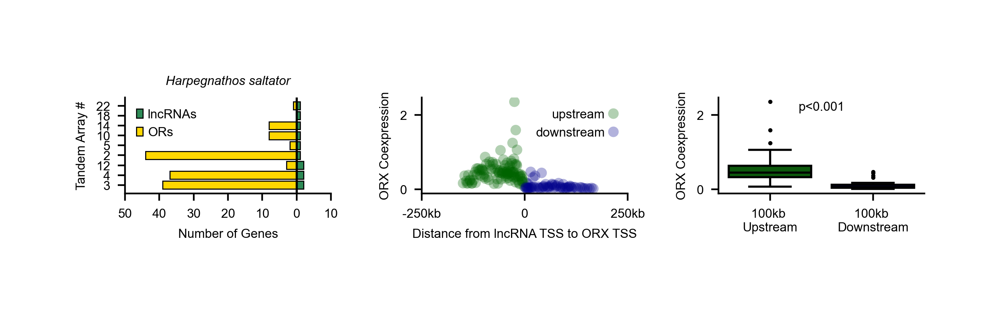

In [139]:
# Scatter plot of coexpression vs distance_adjusted, two subplots for P1 and P14, with KDE 
white_plotting()
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
fontsize=6
f, axs = plt.subplots(1, 3, figsize=(6, 1.5), dpi=200)

ax = axs[0]

y_labels = counts['TA']
y_pos = np.arange(len(y_labels))

ax.barh(y_pos, counts['num_lnc'], color='seagreen', label='lncRNAs', linewidth=0.5, edgecolor='black')
ax.barh(y_pos, -counts['num_ORs'], color='gold', label='ORs', linewidth=0.5, edgecolor='black')

# Y axis 
ax.set_yticks(y_pos)
ax.set_yticklabels(y_labels, fontsize=fontsize)
ax.set_ylabel('Tandem Array #', fontsize=fontsize)
ax.set_title("Harpegnathos saltator", fontsize=fontsize, style='italic')

# X labels 
ax.set_xticks([-50, -40, -30, -20, -10, 0, 10], labels=[50, 40, 30, 20, 10, 0, 10], fontsize=fontsize)
ax.set_xlabel('')
ax.axvline(0, color='black', linewidth=1) 

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xlabel("Number of Genes", fontsize=fontsize)
ax.legend(loc='upper left', fontsize=fontsize, frameon=False)

palette=['darkgreen', 'darkblue']
ax = axs[1]
sns.scatterplot(data=lnc_associated_ORs, x='distance_adjusted', y="OR_coexpression", ax=ax, hue='location', hue_order=['upstream', 'downstream'], palette=palette, s=25, legend=True, lw=0, edgecolor='black', alpha=0.3)
ax.set_xlabel('Distance from lncRNA TSS to ORX TSS', fontsize=fontsize)
ax.set_ylabel('ORX Coexpression', fontsize=fontsize)
ax.set_xlim(-250_000, 250_000)
ax.set_xticks([-250_000, 0, 250_000], labels=['-250kb', '0', '250kb'], fontsize=fontsize)
ax.set_yticks([0, 2], labels=[0, 2], fontsize=fontsize)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc='upper right', fontsize=fontsize, frameon=False, markerfirst=False)

ax = axs[2]
max_distance = 100_000
data_subset=lnc_associated_ORs[lnc_associated_ORs['tss2tss'] < max_distance]
labels = ['100kb \nUpstream', '100kb \nDownstream']
# Plot box plot of OR coexpression by location and add stats 
bx = sns.boxplot(data=data_subset, x='location', y='OR_coexpression', ax=ax, palette=palette, hue_order=['upstream', 'downstream'], order=['upstream', 'downstream'], linewidth=1, linecolor='black', fliersize=1)
ax.set_xlabel('')
ax.set_ylabel('ORX Coexpression', fontsize=fontsize)
ax.set_xticks([0, 1], labels=labels, fontsize=fontsize)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_yticks([0, 2], labels=[0, 2], fontsize=fontsize)

# Rank sum test 
upstream = data_subset.loc[data_subset['location'] == 'upstream', 'OR_coexpression']
downstream = data_subset.loc[data_subset['location'] == 'downstream', 'OR_coexpression']
from scipy.stats import ranksums
stat, p = ranksums(upstream, downstream)
p_value_str = f"p={p:.3f}" if p >= 0.001 else "p<0.001"
plt.text(0.5, 0.9, p_value_str, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=fontsize)

plt.tight_layout()
#plt.suptitle(f'ORX Coexpression with Annotated Antisense lncRNAs Nested in Tandem Arrays (Harpegnathos saltator)', fontsize=6, y=0.95)
#plt.suptitle(f'Harpegnathos saltator', fontsize=6, y=0.95)
plt.savefig(f"/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/lncRNA Paper/figure_pdfs/Hsalt-lncRNA-ORX-coexpression.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

## Identify cells with valence OR in a tandem array that has a lncRNA 

In [140]:
# Make a dataframe with cell ID in a column and individual columns for each OR 
cell_or_expression = pd.DataFrame(index=adata.obs.index, columns=or_db.gene_name)
for i, row in or_db.iterrows(): 
    cell_or_expression[row.gene_name] = adata[:,row['gene_name']].X.toarray().flatten()

In [141]:
# Find the highest-expressing OR in each cell 
cell_valence_OR = cell_or_expression.idxmax(axis=1)
cell_valence_OR = cell_valence_OR.reset_index()
cell_valence_OR.columns = ['cell_index', 'valence_OR']
cell_valence_OR['tandem_array'] = cell_valence_OR['valence_OR'].apply(lambda x: or_db.loc[or_db['gene_name'] == x, 'tandem_array'].values[0])
cell_valence_OR['or_strand'] = cell_valence_OR['valence_OR'].apply(lambda x: tr.get_gene(x).strand)
cell_valence_OR

,cell_index,valence_OR,tandem_array,or_strand
0,AAACCCAAGACTCATC-1-0,HsOr98,4,+
1,AAACCCAGTAGATTAG-1-0,HsOr295,5,+
2,AAACCCATCCACGTAA-1-0,HsOr260,20,+
3,AAACCCATCCTACGGG-1-0,HsOr275,5,+
4,AAACGAAGTTCTTAGG-1-0,HsOr340,2,+
...,...,...,...,...
17797,TTTGTTGCATGCCGGT-1-2,HsOr205,16,+
17798,TTTGTTGGTAGTTCCA-1-2,HsOr272,11,+
17799,TTTGTTGGTATACGGG-1-2,HsOr71,6,+
17800,TTTGTTGGTCTGGTTA-1-2,HsOr30,1,-


In [142]:
# Remove cells that do not have a lncRNA in the tandem array 
cell_valence_OR = cell_valence_OR[cell_valence_OR['tandem_array'].isin(nested_lncRNAs['TA'])].reset_index(drop=True)
cell_valence_OR

,cell_index,valence_OR,tandem_array,or_strand
0,AAACCCAAGACTCATC-1-0,HsOr98,4,+
1,AAACCCAGTAGATTAG-1-0,HsOr295,5,+
2,AAACCCATCCTACGGG-1-0,HsOr275,5,+
3,AAACGAAGTTCTTAGG-1-0,HsOr340,2,+
4,AAACGCTAGTTCAACC-1-0,HsOr312,2,+
...,...,...,...,...
11098,TTTGGTTCAAATGATG-1-2,HsOr291,5,+
11099,TTTGGTTGTCGCATTA-1-2,HsOr320,2,+
11100,TTTGTTGCAAGTTGGG-1-2,HsOr289,5,+
11101,TTTGTTGCAGGAGGAG-1-2,HsOr308,2,+


## Assign lncRNAs to valence ORs 
- Assert that the lncRNA and valence OR are on opposite strands 
- Assert that all transcript isoforms have a 3' end that is upstream of the OR TSS 
- Assert that min distance from the lncRNA 3' end (across all transcript isoforms) to the TSS is less than 10kb 
- Only save the lncRNA with the minimum `tss_2_lnc_end` distance 
- Remove cells where no lncRNA was assigned 
- Save expression of lncRNA and valence OR for each cell 

In [143]:
# For each cell and valence OR, look for a lncRNA whose 3' end is upstream of the OR TSS and whose 5' end is closest to the OR TSS 
max_distance = 10_000
for i, row in tqdm(cell_valence_OR.iterrows(), total=cell_valence_OR.shape[0]):
    or_bounds = tr.get_gene(row['valence_OR']).get_transcript_longest_cds().get_bounds()
    or_tss = or_bounds[0] if row['or_strand'] == "+" else or_bounds[1]
    # Get lncRNAs in the TA
    relevant_lncRNAs = nested_lncRNAs[nested_lncRNAs['TA'] == row['tandem_array']]
    relevant_lncRNAs['tss2tss'] = None
    relevant_lncRNAs['all_upstream'] = None
    for j, lncRNA in relevant_lncRNAs.iterrows():
        # check that strands are opposite 
        if row['or_strand'] == lncRNA['lnc_strand']:
            continue
        # get the bounds of the lncRNA 
        lnc_transcripts = tr.get_gene(lncRNA['gene_name']).transcripts 
        end_ind = 1 if lncRNA['lnc_strand'] == "+" else 0
        lnc_ends = [transcript.get_bounds()[end_ind] for transcript in lnc_transcripts]
        lnc_starts = [transcript.get_bounds()[1-end_ind] for transcript in lnc_transcripts]
        # Check that all transcripts have a 3' end upstream of the OR TSS
        all_upstream = all([lnc_end < or_tss for lnc_end in lnc_ends]) if row['or_strand'] == "+" else all([lnc_end > or_tss for lnc_end in lnc_ends])
        if all_upstream: 
            #tss_to_tss = min([abs(or_tss - lnc_start) for lnc_start in lnc_starts])
            tss_to_tss = min([(or_tss - lnc_start) for lnc_start in lnc_starts]) if row['or_strand'] == "+" else min([lnc_start - or_tss for lnc_start in lnc_starts])
            tss_2_lnc_end = min([abs(lnc_end - or_tss) for lnc_end in lnc_ends])
            relevant_lncRNAs.at[j, 'tss_2_lnc_end'] = tss_2_lnc_end
            relevant_lncRNAs.at[j, 'tss2tss'] = tss_to_tss
            relevant_lncRNAs.at[j, 'all_upstream'] = True
    # Save the lncRNA with the smallest tss2tss
    if relevant_lncRNAs.shape[0] > 0 and np.sum(relevant_lncRNAs['all_upstream']) > 0:
        relevant_lncRNAs = relevant_lncRNAs[relevant_lncRNAs['all_upstream']==True]
        relevant_lncRNAs = relevant_lncRNAs.iloc[np.argmin(relevant_lncRNAs['tss_2_lnc_end']), :]
        # Verify tss_2_lnc_end < max_distance 
        if relevant_lncRNAs['tss_2_lnc_end'] > max_distance: 
            continue
        cell_valence_OR.at[i, 'lncRNA'] = relevant_lncRNAs['gene_name']
        cell_valence_OR.at[i, 'tss_2_lnc_end'] = relevant_lncRNAs['tss_2_lnc_end']
        cell_valence_OR.at[i, 'tss2tss'] = relevant_lncRNAs['tss2tss']
        cell_valence_OR.at[i, 'lnc_strand'] = relevant_lncRNAs['lnc_strand']

cell_valence_OR

100%|██████████| 11103/11103 [00:06<00:00, 1797.39it/s]


,cell_index,valence_OR,tandem_array,or_strand,lncRNA,tss_2_lnc_end,tss2tss,lnc_strand
0,AAACCCAAGACTCATC-1-0,HsOr98,4,+,NaN,NaN,NaN,NaN
1,AAACCCAGTAGATTAG-1-0,HsOr295,5,+,NaN,NaN,NaN,NaN
2,AAACCCATCCTACGGG-1-0,HsOr275,5,+,NaN,NaN,NaN,NaN
3,AAACGAAGTTCTTAGG-1-0,HsOr340,2,+,NaN,NaN,NaN,NaN
4,AAACGCTAGTTCAACC-1-0,HsOr312,2,+,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
11098,TTTGGTTCAAATGATG-1-2,HsOr291,5,+,NaN,NaN,NaN,NaN
11099,TTTGGTTGTCGCATTA-1-2,HsOr320,2,+,NaN,NaN,NaN,NaN
11100,TTTGTTGCAAGTTGGG-1-2,HsOr289,5,+,NaN,NaN,NaN,NaN
11101,TTTGTTGCAGGAGGAG-1-2,HsOr308,2,+,NaN,NaN,NaN,NaN


In [144]:
print(f"Dropped {cell_valence_OR[cell_valence_OR.tss_2_lnc_end < 0].shape[0]} rows where tss_2_lnc_end is negative")
cell_valence_OR = cell_valence_OR[cell_valence_OR.tss_2_lnc_end > 0].reset_index(drop=True)
cell_valence_OR = cell_valence_OR.dropna().reset_index(drop=True)
cell_valence_OR

Dropped 0 rows where tss_2_lnc_end is negative


,cell_index,valence_OR,tandem_array,or_strand,lncRNA,tss_2_lnc_end,tss2tss,lnc_strand
0,AACCATGTCGTAACTG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+
1,AACGGGATCACGGGAA-1-0,HsOr257.1,12,+,LOC112588178,821.0,-71.0,-
2,AAGACAAGTCGTCATA-1-0,HsOr279,5,+,LOC112589800,9895.0,9169.0,-
3,AAGTTCGCACTTCATT-1-0,HsOr257.3,12,+,LOC112588178,8250.0,7358.0,-
4,ACAGCCGGTTCCTAAG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+
...,...,...,...,...,...,...,...,...
557,TTGGGTAAGAACCGCA-1-2,HsOr279,5,+,LOC112589800,9895.0,9169.0,-
558,TTGTGTTTCGGTCGGT-1-2,HsOr120,4,+,LOC112589985,6317.0,-2130.0,-
559,TTGTTCACACTTGAGT-1-2,HsOr257.2,12,+,LOC112588178,3813.0,2921.0,-
560,TTGTTCAGTGCGTTTA-1-2,HsOr257.2,12,+,LOC112588178,3813.0,2921.0,-


In [145]:
# Get expression of lncRNA and valence OR in each cell 
cell_valence_OR['lncRNA_expression'] = cell_valence_OR.apply(lambda x: adata[x['cell_index'], x['lncRNA']].X.toarray().flatten()[0], axis=1)
cell_valence_OR['valence_OR_expression'] = cell_valence_OR.apply(lambda x: adata[x['cell_index'], x['valence_OR']].X.toarray().flatten()[0], axis=1)

<Axes: xlabel='lncRNA_expression', ylabel='valence_OR_expression'>

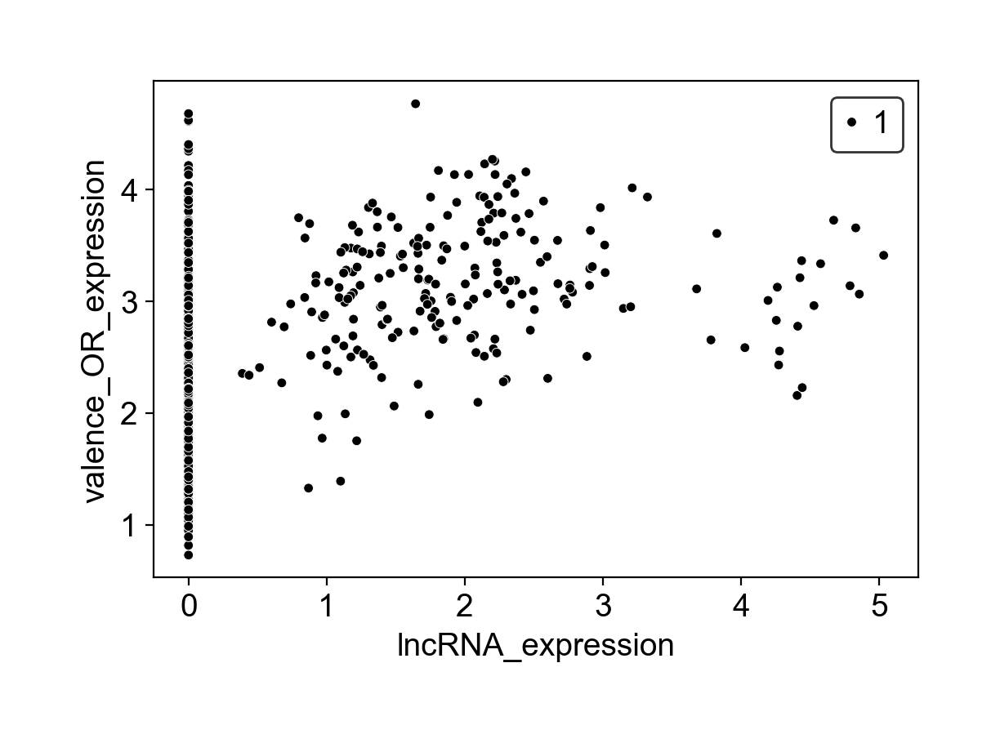

In [146]:
# Plot scatter of lncRNA expression vs valence OR expression
white_plotting()
plt.figure(figsize=(6, 4))
sns.scatterplot(data=cell_valence_OR, x='lncRNA_expression', y='valence_OR_expression', color='black', size=1)

## Get ORs upstream and downstream of the valence OR 
- Assert that the valence OR is not at the start or the end of the tandem array (ensuring it has both a downstream and upstream OR)
- Assert that the valence OR and both it's upstream and downstream ORs are on the same strand 
- Save the expression of both the upstream and downstream ORs for each cell 

In [147]:
# Get upstream and downstream ORs 
for i, row in tqdm(cell_valence_OR.iterrows(), total=cell_valence_OR.shape[0]): 
    valence_strand = or_db.loc[or_db['gene_name'] == row['valence_OR'], 'strand'].values[0]
    valence_tss = or_db.loc[or_db['gene_name'] == row['valence_OR'], 'start'].values[0]
    other_ORs = or_db.loc[or_db['tandem_array'] == row['tandem_array']] 
    valence_index = or_db.loc[or_db['gene_name'] == row['valence_OR'], 'ta_index'].values[0]
    TA_size = or_db.loc[or_db['gene_name'] == row['valence_OR'], 'ta_size'].values[0]
    # if or's index is 1 or ta_index, continue 
    if valence_index == 0 or valence_index == TA_size:
        continue
    if valence_tss == np.min(other_ORs['start']) or valence_tss == np.max(other_ORs['start']):
        continue
    if valence_strand == '+': 
        # find OR in other_ORs that is closest to the start of valence_OR
        upstream_OR = other_ORs[other_ORs['start'] < valence_tss].sort_values(by='start', ascending=False).iloc[0]
        downstream_OR = other_ORs[other_ORs['start'] > valence_tss].sort_values(by='start').iloc[0]
    else: 
        # find OR in other_ORs that is closest to the start of valence_OR
        upstream_OR = other_ORs[other_ORs['start'] > valence_tss].sort_values(by='start').iloc[0]
        downstream_OR = other_ORs[other_ORs['start'] < valence_tss].sort_values(by='start', ascending=False).iloc[0]
    cell_valence_OR.at[i, 'upstream_OR'] = upstream_OR['gene_name']
    cell_valence_OR.at[i, 'downstream_OR'] = downstream_OR['gene_name']
cell_valence_OR

100%|██████████| 562/562 [00:00<00:00, 1062.02it/s]


,cell_index,valence_OR,tandem_array,or_strand,lncRNA,tss_2_lnc_end,tss2tss,lnc_strand,lncRNA_expression,valence_OR_expression,upstream_OR,downstream_OR
0,AACCATGTCGTAACTG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,1.101286,1.389302,HsOr161,HsOr159
1,AACGGGATCACGGGAA-1-0,HsOr257.1,12,+,LOC112588178,821.0,-71.0,-,0.000000,2.460156,HsOr256,HsOr257.2
2,AAGACAAGTCGTCATA-1-0,HsOr279,5,+,LOC112589800,9895.0,9169.0,-,0.000000,4.613598,HsOr278,HsOr280
3,AAGTTCGCACTTCATT-1-0,HsOr257.3,12,+,LOC112588178,8250.0,7358.0,-,1.517042,2.723587,HsOr257.2,HsOr257.4
4,ACAGCCGGTTCCTAAG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,1.580938,HsOr161,HsOr159
...,...,...,...,...,...,...,...,...,...,...,...,...
557,TTGGGTAAGAACCGCA-1-2,HsOr279,5,+,LOC112589800,9895.0,9169.0,-,1.389302,3.437866,HsOr278,HsOr280
558,TTGTGTTTCGGTCGGT-1-2,HsOr120,4,+,LOC112589985,6317.0,-2130.0,-,0.000000,3.905832,HsOr119,HsOr121
559,TTGTTCACACTTGAGT-1-2,HsOr257.2,12,+,LOC112588178,3813.0,2921.0,-,0.000000,1.316809,HsOr257.1,HsOr257.3
560,TTGTTCAGTGCGTTTA-1-2,HsOr257.2,12,+,LOC112588178,3813.0,2921.0,-,0.000000,1.966328,HsOr257.1,HsOr257.3


In [148]:
# Drop NaN Rows 
cell_valence_OR = cell_valence_OR.dropna().reset_index(drop=True)

In [149]:
# Get strand for upstream and downstream ORs
cell_valence_OR['upstream_OR_strand'] = cell_valence_OR['upstream_OR'].apply(lambda x: or_db.loc[or_db['gene_name'] == x, 'strand'].values[0])
cell_valence_OR['downstream_OR_strand'] = cell_valence_OR['downstream_OR'].apply(lambda x: or_db.loc[or_db['gene_name'] == x, 'strand'].values[0])

In [150]:
# Remove rows where upstream and valence and downstream ORs are not all on the same strand 
cell_valence_OR = cell_valence_OR[(cell_valence_OR['upstream_OR_strand'] == cell_valence_OR['or_strand']) & (cell_valence_OR['downstream_OR_strand'] == cell_valence_OR['or_strand'])].reset_index(drop=True)

In [151]:
# Get expression of upstream and downstream ORs in each cell
cell_valence_OR['upstream_OR_expression'] = cell_valence_OR.apply(lambda x: adata[x['cell_index'], x['upstream_OR']].X.toarray().flatten()[0], axis=1)
cell_valence_OR['downstream_OR_expression'] = cell_valence_OR.apply(lambda x: adata[x['cell_index'], x['downstream_OR']].X.toarray().flatten()[0], axis=1)

In [152]:
cell_valence_OR

,cell_index,valence_OR,tandem_array,or_strand,lncRNA,tss_2_lnc_end,tss2tss,lnc_strand,lncRNA_expression,valence_OR_expression,upstream_OR,downstream_OR,upstream_OR_strand,downstream_OR_strand,upstream_OR_expression,downstream_OR_expression
0,AACCATGTCGTAACTG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,1.101286,1.389302,HsOr161,HsOr159,-,-,0.000000,0.000000
1,AACGGGATCACGGGAA-1-0,HsOr257.1,12,+,LOC112588178,821.0,-71.0,-,0.000000,2.460156,HsOr256,HsOr257.2,+,+,0.000000,0.000000
2,AAGACAAGTCGTCATA-1-0,HsOr279,5,+,LOC112589800,9895.0,9169.0,-,0.000000,4.613598,HsOr278,HsOr280,+,+,1.576965,3.327971
3,AAGTTCGCACTTCATT-1-0,HsOr257.3,12,+,LOC112588178,8250.0,7358.0,-,1.517042,2.723587,HsOr257.2,HsOr257.4,+,+,2.094015,1.517042
4,ACAGCCGGTTCCTAAG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,1.580938,HsOr161,HsOr159,-,-,1.580938,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,TTGGGTAAGAACCGCA-1-2,HsOr279,5,+,LOC112589800,9895.0,9169.0,-,1.389302,3.437866,HsOr278,HsOr280,+,+,0.000000,2.568650
528,TTGTGTTTCGGTCGGT-1-2,HsOr120,4,+,LOC112589985,6317.0,-2130.0,-,0.000000,3.905832,HsOr119,HsOr121,+,+,0.000000,2.786003
529,TTGTTCACACTTGAGT-1-2,HsOr257.2,12,+,LOC112588178,3813.0,2921.0,-,0.000000,1.316809,HsOr257.1,HsOr257.3,+,+,0.000000,0.000000
530,TTGTTCAGTGCGTTTA-1-2,HsOr257.2,12,+,LOC112588178,3813.0,2921.0,-,0.000000,1.966328,HsOr257.1,HsOr257.3,+,+,1.114529,1.114529


## Initial Plots

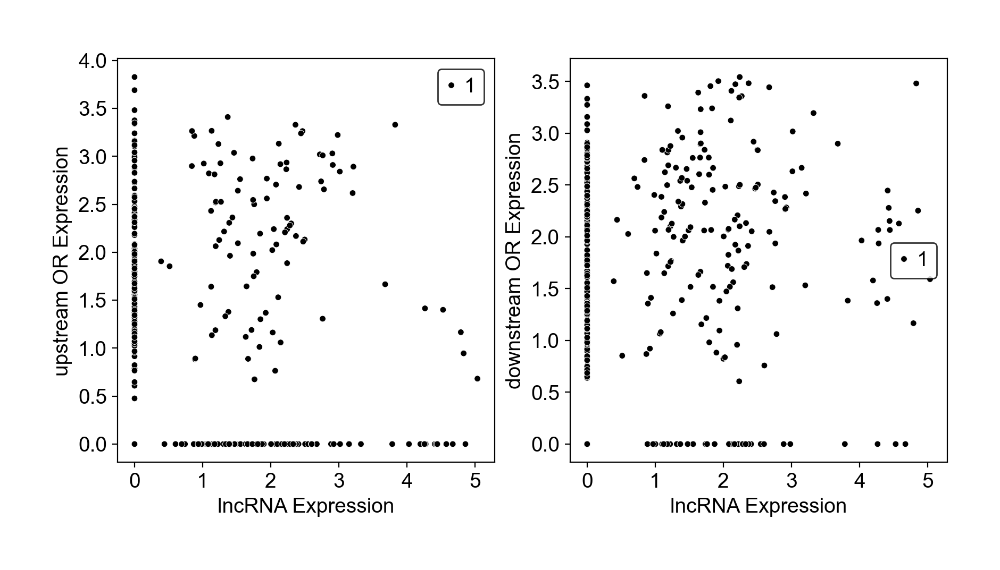

In [153]:
# Plot scatter of upstream and downstream expression vs lncRNA expression 
f, ax = plt.subplots(1, 2, figsize=(10, 5))
white_plotting()
for i, or_type in enumerate(['upstream', 'downstream']):
    sns.scatterplot(data=cell_valence_OR, x='lncRNA_expression', y=f'{or_type}_OR_expression', ax=ax[i], color='black', size=1)
    ax[i].set_xlabel('lncRNA Expression')
    ax[i].set_ylabel(f'{or_type} OR Expression')

## Plot Examples

In [154]:
# get unique lncRNAs that have at least 30 cells 
lncRNA_counts = cell_valence_OR['lncRNA'].value_counts()
lncRNAs = lncRNA_counts[lncRNA_counts > 30].index
lncRNAs

Index(['LOC109504322', 'LOC112589800', 'LOC112588178', 'LOC112589985',
       'LOC109504323'],
      dtype='object', name='lncRNA')

In [155]:
lncRNA = 'LOC109504322'
cells = cell_valence_OR[(cell_valence_OR['lncRNA'] == lncRNA)]
cells['valence_OR'].value_counts()


valence_OR
HsOr160    137
HsOr161     60
Name: count, dtype: int64

In [156]:
# find cells where lncRNA = LOC109611159
valence_OR = "HsOr160"
cells = cell_valence_OR[(cell_valence_OR['lncRNA'] == lncRNA) & (cell_valence_OR['valence_OR'] == valence_OR)]
pd.set_option('display.max_rows', 10)
cells

,cell_index,valence_OR,tandem_array,or_strand,lncRNA,tss_2_lnc_end,tss2tss,lnc_strand,lncRNA_expression,valence_OR_expression,upstream_OR,downstream_OR,upstream_OR_strand,downstream_OR_strand,upstream_OR_expression,downstream_OR_expression
0,AACCATGTCGTAACTG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,1.101286,1.389302,HsOr161,HsOr159,-,-,0.000000,0.000000
4,ACAGCCGGTTCCTAAG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,1.580938,HsOr161,HsOr159,-,-,1.580938,0.000000
5,ACTCTCGTCTGTGTGA-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,4.621951,HsOr161,HsOr159,-,-,1.986951,1.986951
7,AGTACCATCTTAGCCC-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,2.038623,HsOr161,HsOr159,-,-,0.000000,0.000000
22,GACCCTTCATTCCTCG-1-0,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,1.292791,HsOr161,HsOr159,-,-,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,TCTCAGCAGGGTTGCA-1-2,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,2.268953,HsOr161,HsOr159,-,-,1.674220,0.000000
505,TCTCCGAAGAGAATCT-1-2,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,1.870957,3.469962,HsOr161,HsOr159,-,-,0.000000,0.000000
508,TGAATCGGTCGTGGTC-1-2,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,0.000000,2.223662,HsOr161,HsOr159,-,-,1.511142,0.000000
513,TGCGGGTTCGATCCCT-1-2,HsOr160,3,-,LOC109504322,7826.0,6566.0,+,1.749499,3.663915,HsOr161,HsOr159,-,-,1.749499,1.216650


Chromosome: NW_020229910.1, Start: 637292, End: 651913


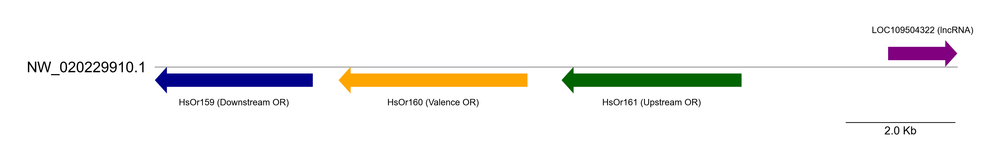

In [157]:
upstream_OR = cells['upstream_OR'].values[0]
downstream_OR = cells['downstream_OR'].values[0]
all_bounds = [tr.get_gene(gene).get_transcript_longest_bounds().get_bounds() for gene in [lncRNA, upstream_OR, valence_OR, downstream_OR]]
chromosome = tr.get_gene(lncRNA).chromosome
start = min([bounds[0] for bounds in all_bounds]) - 5
end = max([bounds[1] for bounds in all_bounds]) + 5
print(f"Chromosome: {chromosome}, Start: {start}, End: {end}")

genes_to_plot = [] 

for gene in list(tr.genes.keys()): 
    gene_obj = tr.get_gene(gene) 
    if gene_obj.chromosome != chromosome: 
        continue
    for transcript in gene_obj.transcripts: 
        if transcript.get_bounds()[0] > start and transcript.get_bounds()[1] < end: 
            genes_to_plot.append(gene)
            break 

white_plotting()
gv = GenomeViz(track_align_type="center", theme="light")
gv.set_scale_bar(ymargin=0.5)

fontsize=12 

# Get bounds 
track = gv.add_feature_track(chromosome, segments = (int(start), int(end)))
#track.add_sublabel(size=fontsize)

# Add gene models to plot 
for gene in genes_to_plot:
    transcript = tr.get_gene(gene).get_transcript_longest_bounds()
    if upstream_OR in gene: 
        color = 'darkgreen'
        label = f'{gene} (Upstream OR)'
    elif downstream_OR in gene:
        color = 'darkblue'
        label = f'{gene} (Downstream OR)'
    elif valence_OR in gene:
        color = 'orange'
        label = f'{gene} (Valence OR)'
    elif lncRNA in gene: 
        color = 'purple'
        label = f'{gene} (lncRNA)'
    else: 
        color = 'grey'
        label = gene
        
    bounds = transcript.get_bounds()
    strand = np.where(transcript.strand == '+', 1, -1) 
    vpos = "top" if strand == 1 else "bottom"
    track.add_feature(
        int(bounds[0]),
        int(bounds[1]), 
        strand, 
        plotstyle='arrow', 
        fc=color, 
        arrow_shaft_ratio = 0.5, 
        label=label, 
        text_kws={'color': 'black', 
                  'rotation': 0, 
                  'vpos': vpos, 
                  'hpos': 'center', 
                  'size':fontsize}
    )

fig = gv.plotfig()
plt.show()

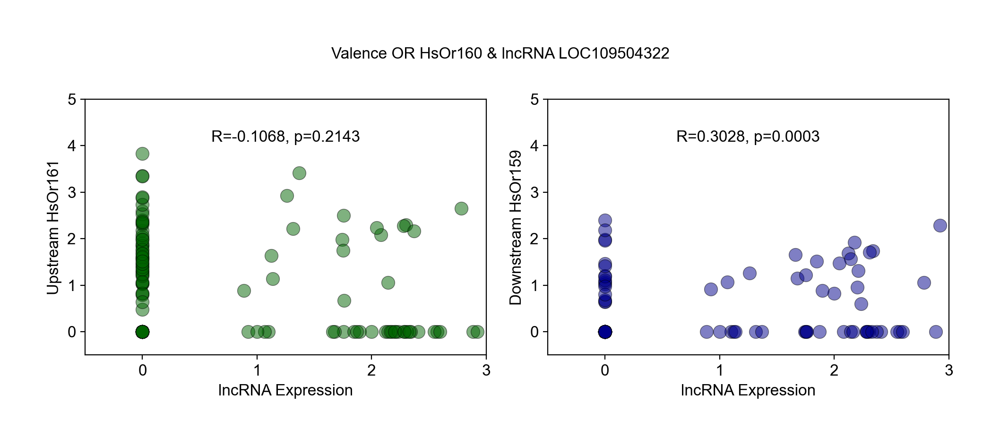

In [158]:
# Plot ustream OR expresion and downstream OR expression vs lncRNA expression bin 
white_plotting()
fontsize=12
f, ax = plt.subplots(1, 2, figsize=(10, 4), sharex=True)
colors = ['darkgreen', 'darkblue']
for i, OR in enumerate(['Upstream', 'Downstream']):
    sns.scatterplot(data=cells, x='lncRNA_expression', y=f'{OR.lower()}_OR_expression', ax=ax[i], color=colors[i], s=100, legend=False, lw=0.5, edgecolor='black', alpha=0.5)
    ax[i].set_xlabel('lncRNA Expression', fontsize=fontsize)
    ax[i].set_ylabel(f'{OR} {cells.iloc[0][OR.lower() + "_OR"]}', fontsize=fontsize)
    r, p = pearsonr(cells['lncRNA_expression'], cells[f'{OR.lower()}_OR_expression'])
    ax[i].text(0.5, 0.85, f'R={r:.4f}, p={p:.4f}', fontsize=fontsize, ha='center', va='center', transform=ax[i].transAxes, color='black')
    ax[i].set_ylim(-0.5, 5)
    ax[i].set_yticks([0, 1, 2, 3, 4, 5])
    ax[i].set_yticklabels(['0', '1', '2', '3', '4', '5'], fontsize=fontsize)
    ax[i].set_xlim(-0.5, 3)
    ax[i].set_xticks([0, 1, 2, 3])
    ax[i].set_xticklabels(['0', '1', '2', '3'], fontsize=fontsize)

plt.suptitle(f"Valence OR {valence_OR} & lncRNA {lncRNA}", fontsize=fontsize)
plt.tight_layout()
plt.show()

## lncRNAs with 3' end close to OR TSS 

In [159]:
min(cell_valence_OR['tss_2_lnc_end']), max(cell_valence_OR['tss_2_lnc_end'])

(821.0, 9895.0)

In [160]:
min(cell_valence_OR['lncRNA_expression']), max(cell_valence_OR['lncRNA_expression'])

(0.0, 5.0341386795043945)

In [161]:
min(cell_valence_OR['upstream_OR_expression']), max(cell_valence_OR['upstream_OR_expression'])

(0.0, 3.8272900581359863)

In [162]:
min(cell_valence_OR['downstream_OR_expression']), max(cell_valence_OR['downstream_OR_expression'])

(0.0, 3.5428831577301025)

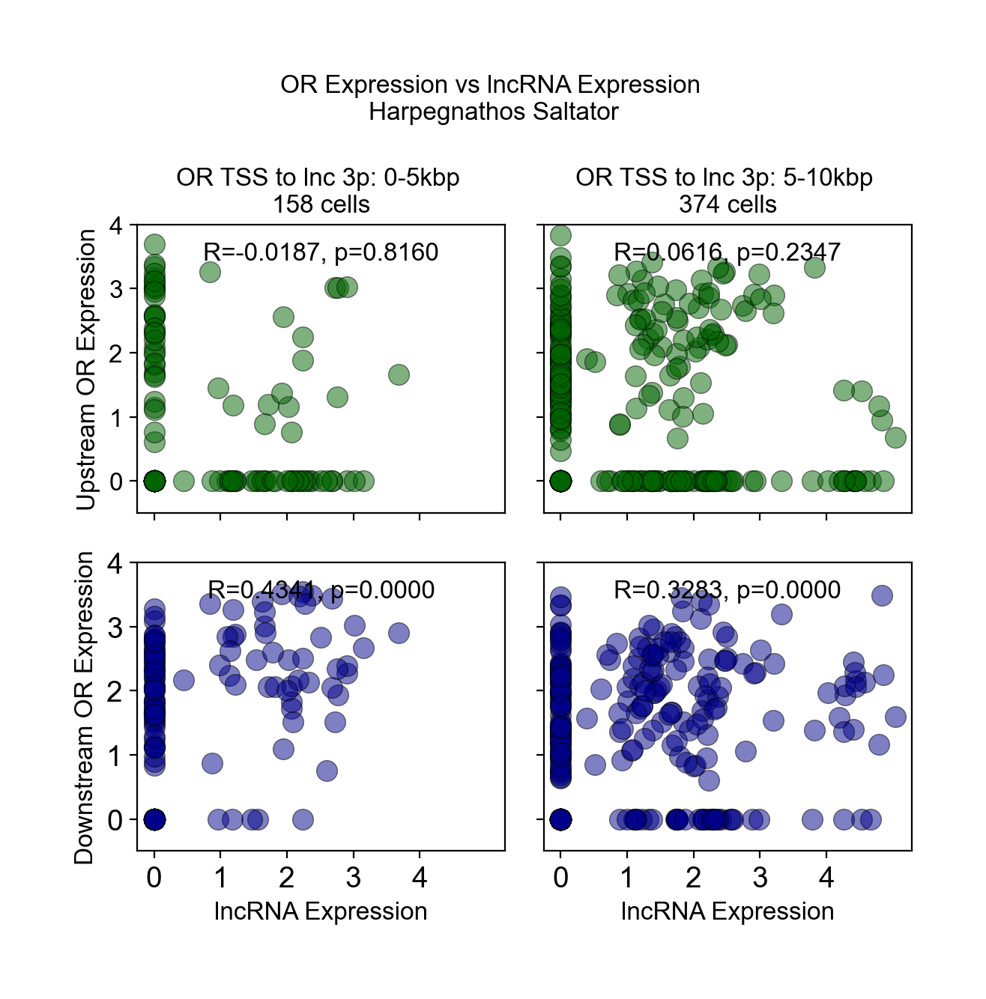

In [163]:
distances = [0, 5000, 10000] 
white_plotting()
fontsize=12
# For each tss_2_lnc_end bin, plot a scatter plot of upstream OR expression vs lncRNA expression
f, ax = plt.subplots(2, len(distances)-1, figsize=(6, 6), sharex=True, sharey=True)
for i in range(len(distances)-1): 
    min_dist = distances[i]
    max_dist = distances[i+1]
    p14_cell_valence_OR_close_bin = cell_valence_OR[(cell_valence_OR['tss_2_lnc_end'] > min_dist) & (cell_valence_OR['tss_2_lnc_end'] < max_dist)]
    
    # Upstream 
    sns.scatterplot(data=p14_cell_valence_OR_close_bin, x='lncRNA_expression', y='upstream_OR_expression', ax=ax[0, i], color='darkgreen', s=100, legend=False, alpha=0.5, lw=0.5, edgecolor='black')
    r, p = pearsonr(p14_cell_valence_OR_close_bin['lncRNA_expression'], p14_cell_valence_OR_close_bin['upstream_OR_expression'])
    ax[0, i].text(0.5, 0.9, f'R={r:.4f}, p={p:.4f}', fontsize=fontsize, ha='center', va='center', transform=ax[0, i].transAxes, color='black')
    ax[0, i].set_ylabel('Upstream OR Expression', fontsize=fontsize)
    ax[0, i].set_title(f'OR TSS to lnc 3p: {int(min_dist/1000)}-{int(max_dist/1000)}kbp \n{p14_cell_valence_OR_close_bin.shape[0]} cells', fontsize=fontsize)
    ax[0, i].set_ylim(-0.5, 4)

    # Downstream 
    sns.scatterplot(data=p14_cell_valence_OR_close_bin, x='lncRNA_expression', y='downstream_OR_expression', ax=ax[1, i], color='darkblue', s=100, legend=False, alpha=0.5, lw=0.5, edgecolor='black')
    r, p = pearsonr(p14_cell_valence_OR_close_bin['lncRNA_expression'], p14_cell_valence_OR_close_bin['downstream_OR_expression'])
    ax[1, i].text(0.5, 0.9, f'R={r:.4f}, p={p:.4f}', fontsize=fontsize, ha='center', va='center', transform=ax[1, i].transAxes, color='black')
    ax[1, i].set_ylabel('Downstream OR Expression', fontsize=fontsize)
    ax[1, i].set_xlabel('lncRNA Expression', fontsize=fontsize)
    ax[0, i].set_yticks([0, 1, 2, 3, 4])
    ax[0, i].set_yticklabels(['0', '1', '2', '3', '4'], fontsize=fontsize)
    # xticks 0 - 6, fontsize
    ax[0, i].set_xticks([0, 1, 2, 3, 4])
    ax[0, i].set_xticklabels(['0', '1', '2', '3', '4'], fontsize=fontsize)

plt.suptitle("OR Expression vs lncRNA Expression \nHarpegnathos Saltator", fontsize=fontsize)

plt.tight_layout()
plt.show()

In [164]:
# Get unique lncRNAs 
lncRNAs = cell_valence_OR['lncRNA'].unique()

# For each lncRNA, get the Pearson correlation of lncRNA expression vs OR expression for upstream and downstream ORs
results = [] 
for lncRNA in lncRNAs: 
    # Get the valence OR with the smallest tss_2_lnc_end
    closest_valence, tss_2_lnc_end = cell_valence_OR.loc[cell_valence_OR['lncRNA'] == lncRNA].sort_values('tss_2_lnc_end').iloc[0][['valence_OR', 'tss_2_lnc_end']]
    cells = cell_valence_OR[(cell_valence_OR['lncRNA'] == lncRNA) & (cell_valence_OR['valence_OR'] == closest_valence)]
    if cells.shape[0] < 3: 
        # Skip if there are fewer than 3 cells, necessary for Pearson correlation
        continue
    r_up, p_up = pearsonr(cells['lncRNA_expression'], cells[f'upstream_OR_expression'])
    r_down, p_down = pearsonr(cells['lncRNA_expression'], cells[f'downstream_OR_expression'])

    results.append({'lncRNA': lncRNA, 'valence': closest_valence, 'n_cells':cells.shape[0], 'r_up': r_up, 'p_up': p_up, 'r_down': r_down, 'p_down': p_down, 'tss_2_lnc_end': tss_2_lnc_end})

results = pd.DataFrame(results)
results

,lncRNA,valence,n_cells,r_up,p_up,r_down,p_down,tss_2_lnc_end
0,LOC109504322,HsOr161,60,-0.267478,0.038819,0.287161,0.026106,3928.0
1,LOC112588178,HsOr257.1,21,-0.181149,0.431966,0.261295,0.252583,821.0
2,LOC112589800,HsOr277,29,-0.222364,0.246301,0.600764,0.000569,3173.0
3,LOC109504323,HsOr164,12,-0.043732,0.892652,0.908537,0.000043,1029.0
4,LOC112589985,HsOr119,3,NaN,NaN,0.877782,0.318045,1595.0
5,LOC109503640,HsOr95,6,-0.200000,0.704000,0.723674,0.103985,3071.0


In [165]:
# drop nan rows 
results = results.dropna().reset_index(drop=True)

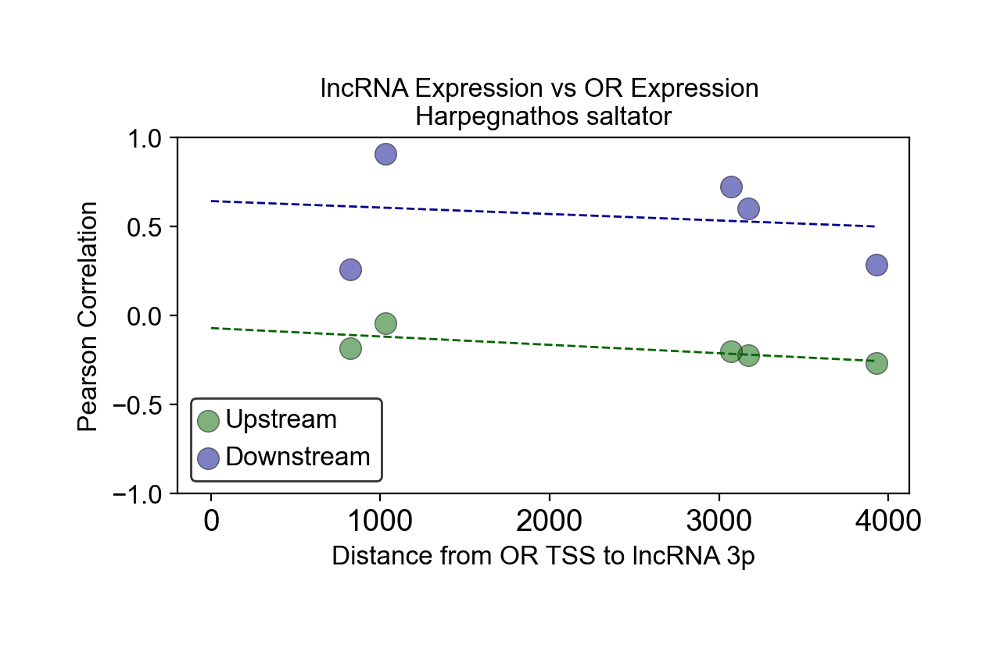

In [166]:
# plot r_up and r_down as a function of tss_2_lnc_end
white_plotting()
fontsize=12
f, ax = plt.subplots(1, 1, figsize=(6, 3), sharey=True)
colors = ['darkgreen', 'darkblue']
sns.scatterplot(data=results, x='tss_2_lnc_end', y='r_up', ax=ax, color='darkgreen', s=100, label='Upstream', alpha=0.5, lw=0.5, edgecolor='black')
sns.scatterplot(data=results, x='tss_2_lnc_end', y='r_down', ax=ax, color='darkblue', s=100, label='Downstream', alpha=0.5, lw=0.5, edgecolor='black')
from scipy.stats import linregress
x = np.linspace(0, np.max(results['tss_2_lnc_end']), 100)
slope, intercept, r_value, p_value, std_err = linregress(results['tss_2_lnc_end'], results['r_up'])
plt.plot(x, slope*x + intercept, color='darkgreen', linestyle='--', lw=1) 
slope, intercept, r_value, p_value, std_err = linregress(results['tss_2_lnc_end'], results['r_down'])
plt.plot(x, slope*x + intercept, color='darkblue', linestyle='--', lw=1)
ax.set_xlabel('Distance from OR TSS to lncRNA 3p', fontsize=fontsize)
ax.set_ylabel('Pearson Correlation', fontsize=fontsize)
plt.title('lncRNA Expression vs OR Expression \nHarpegnathos saltator', fontsize=fontsize)
plt.legend(loc='lower left', fontsize=fontsize)
plt.ylim(-1, 1)
plt.yticks([-1, -0.5, 0, 0.5, 1], fontsize=fontsize)
plt.show()

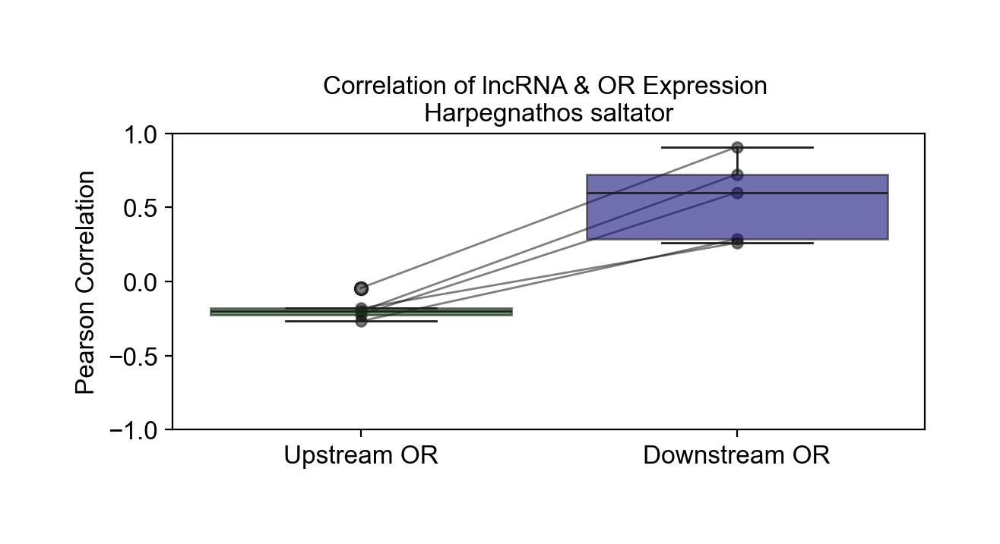

In [167]:
# Plot paired jitter plot of r_up and r_down for each lncRNA
white_plotting()
plt.figure(figsize=(6, 3))
plt.plot([0, 1], [results['r_up'], results['r_down']], color='black', alpha=0.5, marker='o', markersize=5, lw=1)
palette=['darkgreen', 'darkblue']
bx = sns.boxplot(data=results[['r_up', 'r_down']], palette=palette, linewidth=1)
for patch in bx.patches:
    patch.set_alpha(0.6)
plt.xticks([0, 1], ['Upstream OR', 'Downstream OR'], fontsize=12)
plt.ylabel('Pearson Correlation', fontsize=12)
plt.title('Correlation of lncRNA & OR Expression \nHarpegnathos saltator', fontsize=12)
plt.ylim(-1, 1)
plt.yticks([-1, -0.5, 0, 0.5, 1], fontsize=12)
plt.tight_layout()
plt.show()

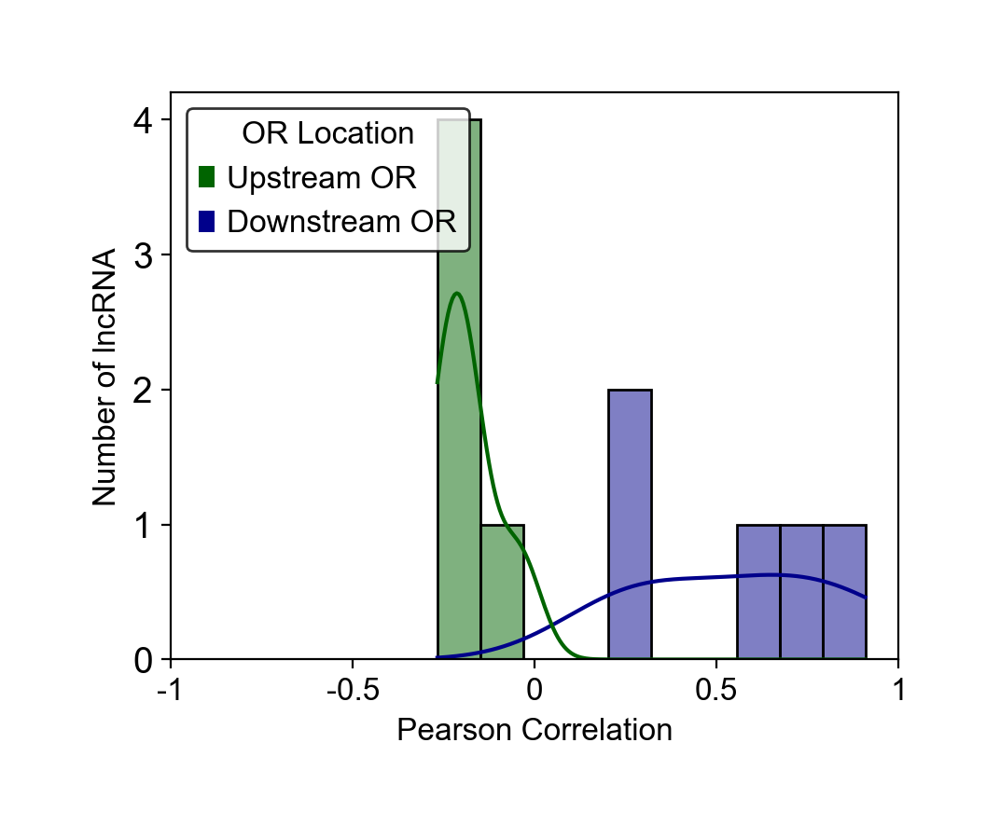

In [168]:
# Plot histograms of r_up and r_down in two subplots 
results_melted = results.melt(id_vars=['lncRNA', 'valence', 'n_cells', 'tss_2_lnc_end'], value_vars=['r_up', 'r_down'], var_name='OR', value_name='r')
white_plotting()
fontsize=12
f, ax = plt.subplots(1, 1, figsize=(5, 4), sharey=True, sharex=True)
colors = ['darkgreen', 'darkblue']
sns.histplot(results_melted, x='r', hue='OR', ax=ax, kde=True, palette=colors, legend=False, bins=10) 
ax.set_xlabel('Pearson Correlation', fontsize=fontsize)
ax.set_ylabel('Number of lncRNA', fontsize=fontsize)
ax.set_xlim(-1, 1)
ax.set_xticks([-1, -0.5, 0, 0.5, 1])
ax.set_xticklabels([-1, -0.5, 0, 0.5, 1], fontsize=fontsize)
plt.bar(0, 0, color='darkgreen', label='Upstream OR')
plt.bar(0, 0, color='darkblue', label='Downstream OR')
plt.legend(title='OR Location', loc='upper left', fontsize=fontsize, title_fontsize=fontsize)

### Plot Correlations for each unique valence OR

In [169]:
# Get unique valence ORs 
valence_ORs = cell_valence_OR['valence_OR'].unique()

# For each lncRNA, get the Pearson correlation of lncRNA expression vs OR expression for upstream and downstream ORs
results = [] 
for valence_OR in valence_ORs: 
    cells = cell_valence_OR[(cell_valence_OR['valence_OR'] == valence_OR)]
    if cells.shape[0] < 5: 
        continue
    r_up, p_up = pearsonr(cells['lncRNA_expression'], cells['upstream_OR_expression'])
    r_down, p_down = pearsonr(cells['lncRNA_expression'], cells['downstream_OR_expression'])
    r_valence, p_up = pearsonr(cells['lncRNA_expression'], cells['valence_OR_expression'])
    # Get the tss_2_lnc_end for the valence OR
    tss_2_lnc_end = cell_valence_OR.loc[cell_valence_OR['valence_OR'] == valence_OR, 'tss_2_lnc_end'].values[0]
    tss2tss = cell_valence_OR.loc[cell_valence_OR['valence_OR'] == valence_OR, 'tss2tss'].values[0]

    results.append({'valence': valence_OR, 'n_cells':cells.shape[0],  'tss_2_lnc_end': tss_2_lnc_end, 'tss2tss': tss2tss, 
                    'r_up': r_up, 'p_up': p_up, 'r_down': r_down, 'p_down': p_down, 'r_valence': r_valence, 'p_valence': p_up})

results = pd.DataFrame(results)
results = results.dropna().reset_index(drop=True)
results

,valence,n_cells,tss_2_lnc_end,tss2tss,r_up,p_up,r_down,p_down,r_valence,p_valence
0,HsOr160,137,7826.0,6566.0,-0.106761,1.019544e-09,0.302811,0.000322,0.492035,1.019544e-09
1,HsOr257.1,21,821.0,-71.0,-0.181149,4.968493e-01,0.261295,0.252583,0.156957,4.968493e-01
2,HsOr279,105,9895.0,9169.0,0.537537,1.490443e-04,0.412006,0.000013,0.361834,1.490443e-04
3,HsOr257.3,23,8250.0,7358.0,0.246419,2.980035e-01,0.291587,0.177024,0.226810,2.980035e-01
4,HsOr163,17,4268.0,3113.0,0.794154,8.384583e-05,0.669834,0.003264,0.809070,8.384583e-05
...,...,...,...,...,...,...,...,...,...,...
8,HsOr162,12,7982.0,6827.0,0.142118,1.878365e-01,0.542932,0.068136,0.408108,1.878365e-01
9,HsOr120,47,6317.0,-2130.0,-0.434377,1.574550e-01,0.400079,0.005330,0.209552,1.574550e-01
10,HsOr94,23,6107.0,3611.0,0.218094,3.188415e-05,0.567132,0.004771,0.754514,3.188415e-05
11,HsOr95,6,3071.0,575.0,-0.200000,9.943746e-02,0.723674,0.103985,0.730101,9.943746e-02


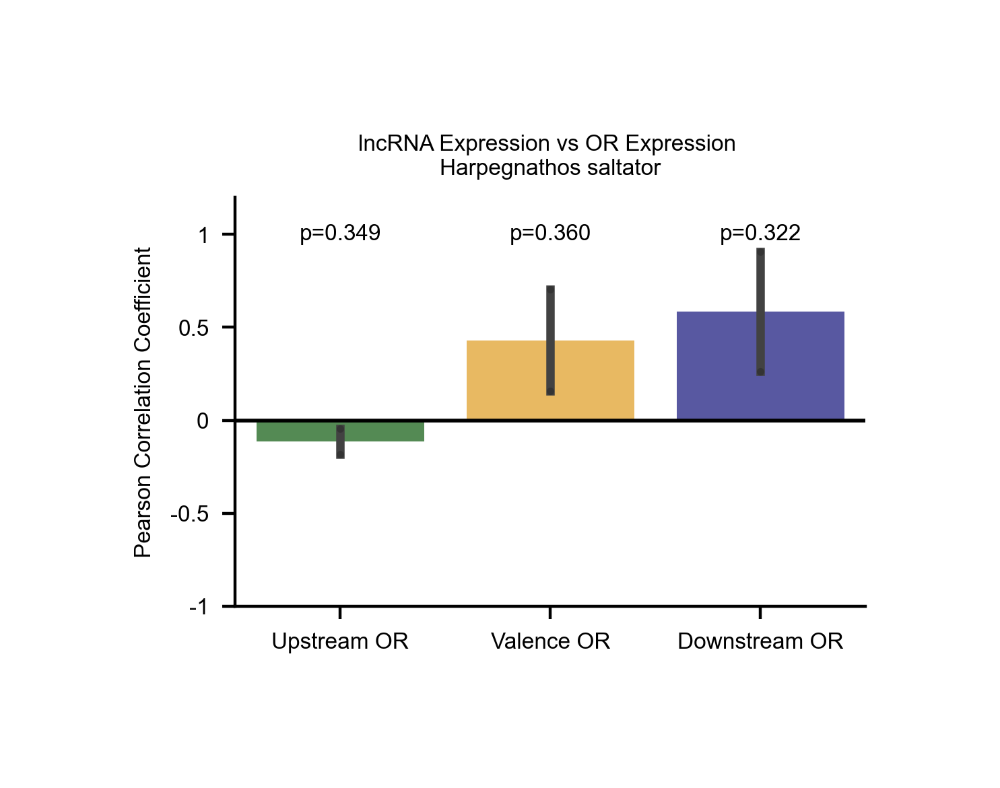

In [170]:
# Plot bar plots of r_up, r_valence and r_down all in the same plot 
max_distance = 3_000 
results_subset = results[(results['tss_2_lnc_end'] < max_distance) & (results['tss_2_lnc_end'] > 0)]
white_plotting()
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
f, ax = plt.subplots(1, 1, figsize=(3, 2), dpi=200)

sns.swarmplot(data=results_subset, x=0, y='r_up', ax=ax, color='black', size=2, alpha=0.2)
sns.swarmplot(data=results_subset, x=1, y='r_valence', ax=ax, color='black', size=2, alpha=0.2)
sns.swarmplot(data=results_subset, x=2, y='r_down', ax=ax, color='black', size=2, alpha=0.2)

sns.barplot(data=results_subset, x=0, y='r_up', ax=ax, color='darkgreen', alpha=0.7, label='Upstream')
sns.barplot(data=results_subset, x=1, y='r_valence', ax=ax, color='orange', alpha=0.7, label='Valence')
sns.barplot(data=results_subset, x=2, y='r_down', ax=ax, color='darkblue', alpha=0.7, label='Downstream')

ax.set_xticks([0, 1, 2], ['Upstream OR', 'Valence OR', 'Downstream OR'], fontsize=6)
ax.set_ylabel('Pearson Correlation Coefficient', fontsize=6)
ax.set_title('lncRNA Expression vs OR Expression \nHarpegnathos saltator', fontsize=6)
plt.legend([],[], frameon=False)
ax.set_ylim(-1, 1.2)
ax.set_yticks([-1, -0.5, 0, 0.5, 1], labels=['-1', '-0.5', '0', '0.5', '1'], fontsize=6)
# line at y=0
plt.axhline(0, color='black', lw=1)

# remove spines 
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)


# Add stats (different from 0) 
from scipy.stats import ttest_1samp
for i, or_ in enumerate(['up', 'valence', 'down']):
    r = results_subset[f'r_{or_}']
    t, p = ttest_1samp(r, 0)
    p_value_str = f"p={p:.3f}" if p >= 0.001 else "p<0.001"
    plt.text(i, 1, p_value_str, ha='center', va='center', transform=ax.transData, fontsize=6, color='black')

plt.show()

### Plot Correlations for each unique lncRNA

In [171]:
# Get unique lncRNAs 
lncRNAs = cell_valence_OR['lncRNA'].unique()

# For each lncRNA, get the Pearson correlation of lncRNA expression vs OR expression for upstream and downstream ORs
results = [] 
for lncRNA in lncRNAs: 
    # Get the valence OR with the smallest tss_2_lnc_end
    closest_valence, tss_2_lnc_end = cell_valence_OR.loc[cell_valence_OR['lncRNA'] == lncRNA].sort_values('tss_2_lnc_end').iloc[0][['valence_OR', 'tss_2_lnc_end']]
    cells = cell_valence_OR[(cell_valence_OR['lncRNA'] == lncRNA) & (cell_valence_OR['valence_OR'] == closest_valence)]
    if cells.shape[0] < 3: 
        # Skip if there are fewer than 3 cells, necessary for Pearson correlation
        continue
    r_up, p_up = pearsonr(cells['lncRNA_expression'], cells[f'upstream_OR_expression'])
    r_down, p_down = pearsonr(cells['lncRNA_expression'], cells[f'downstream_OR_expression'])
    r_valence, p_up = pearsonr(cells['lncRNA_expression'], cells['valence_OR_expression'])

    tss_2_lnc_end = cells['tss_2_lnc_end'].values[0]
    tss2tss = cells['tss2tss'].values[0]

    results.append({'lncRNA':lncRNA, 'valence': closest_valence, 'n_cells':cells.shape[0],  'tss_2_lnc_end': tss_2_lnc_end, 'tss2tss': tss2tss, 
                    'r_up': r_up, 'p_up': p_up, 'r_down': r_down, 'p_down': p_down, 'r_valence': r_valence, 'p_valence': p_up})

results = pd.DataFrame(results)
results

,lncRNA,valence,n_cells,tss_2_lnc_end,tss2tss,r_up,p_up,r_down,p_down,r_valence,p_valence
0,LOC109504322,HsOr161,60,3928.0,2668.0,-0.267478,0.078810,0.287161,0.026106,0.228703,0.078810
1,LOC112588178,HsOr257.1,21,821.0,-71.0,-0.181149,0.496849,0.261295,0.252583,0.156957,0.496849
2,LOC112589800,HsOr277,29,3173.0,2447.0,-0.222364,0.026162,0.600764,0.000569,0.412510,0.026162
3,LOC109504323,HsOr164,12,1029.0,-126.0,-0.043732,0.010751,0.908537,0.000043,0.703096,0.010751
4,LOC112589985,HsOr119,3,1595.0,-6852.0,NaN,0.129304,0.877782,0.318045,0.979444,0.129304
5,LOC109503640,HsOr95,6,3071.0,575.0,-0.200000,0.099437,0.723674,0.103985,0.730101,0.099437


In [172]:
cell_valence_OR[(cell_valence_OR['lncRNA'] == 'LOC112589985') & (cell_valence_OR['valence_OR'] == 'HsOr119')]

,cell_index,valence_OR,tandem_array,or_strand,lncRNA,tss_2_lnc_end,tss2tss,lnc_strand,lncRNA_expression,valence_OR_expression,upstream_OR,downstream_OR,upstream_OR_strand,downstream_OR_strand,upstream_OR_expression,downstream_OR_expression
233,GTGAGCCGTTTGTTGG-1-1,HsOr119,4,+,LOC112589985,1595.0,-6852.0,-,1.630568,3.522063,HsOr118,HsOr120,+,+,0.0,3.392743
440,GATCATGCATCTATCT-1-2,HsOr119,4,+,LOC112589985,1595.0,-6852.0,-,0.000000,2.493105,HsOr118,HsOr120,+,+,0.0,0.000000
531,TTTCAGTGTTTACCTT-1-2,HsOr119,4,+,LOC112589985,1595.0,-6852.0,-,0.000000,2.215384,HsOr118,HsOr120,+,+,0.0,1.625797


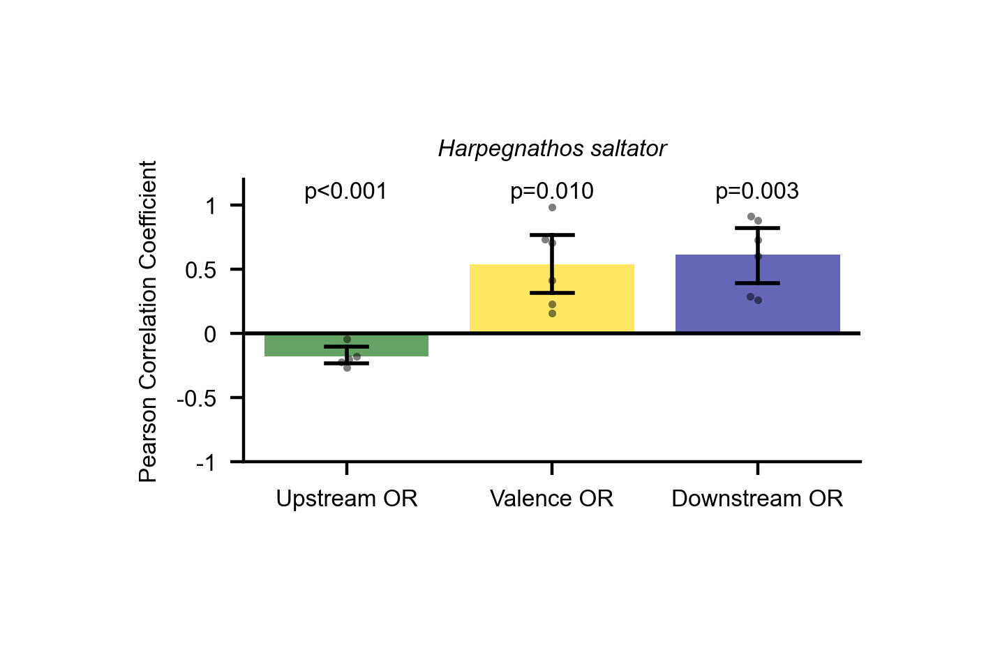

In [183]:
# Plot bar plot of unique lncRNAs with closest valence OR, r_up, r_valence, r_down
max_distance = 5_000 
results_subset = results[(results['tss_2_lnc_end'] < max_distance) & (results['tss_2_lnc_end'] > 0)]
white_plotting()
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
f, ax = plt.subplots(1, 1, figsize=(3, 1.75), dpi=200)


sns.barplot(data=results_subset, x=0, y='r_up', ax=ax, color='darkgreen', alpha=0.6, label='Upstream', saturation=1, errcolor='black', capsize=0.2, errwidth=1)
sns.barplot(data=results_subset, x=1, y='r_valence', ax=ax, color='gold', alpha=0.6, label='Valence', saturation=1, errcolor='black', capsize=0.2, errwidth=1)
sns.barplot(data=results_subset, x=2, y='r_down', ax=ax, color='darkblue', alpha=0.6, label='Downstream', saturation=1, errcolor='black', capsize=0.2, errwidth=1)

sns.swarmplot(data=results_subset, x=0, y='r_up', ax=ax, color='black', size=2, alpha=0.5)
sns.swarmplot(data=results_subset, x=1, y='r_valence', ax=ax, color='black', size=2, alpha=0.5)
sns.swarmplot(data=results_subset, x=2, y='r_down', ax=ax, color='black', size=2, alpha=0.5)

ax.set_xticks([0, 1, 2], ['Upstream OR', 'Valence OR', 'Downstream OR'], fontsize=6)
ax.set_ylabel('Pearson Correlation Coefficient', fontsize=6)
ax.set_title('Harpegnathos saltator', fontsize=6, style='italic')
plt.legend([],[], frameon=False)
ax.set_ylim(-1, 1.2)
ax.set_yticks([-1, -0.5, 0, 0.5, 1], labels=['-1', '-0.5', '0', '0.5', '1'], fontsize=6)
# line at y=0
plt.axhline(0, color='black', lw=1)

# remove spines 
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)


# Add stats (different from 0) 
from scipy.stats import ttest_1samp
for i, or_ in enumerate(['up', 'valence', 'down']):
    r = results_subset[f'r_{or_}']
    t, p = ttest_1samp(r, 0)
    p_value_str = f"p={p:.3f}" if p >= 0.001 else "p<0.001"
    plt.text(i, 1.1, p_value_str, ha='center', va='center', transform=ax.transData, fontsize=6, color='black')

plt.tight_layout()
plt.savefig(f"/Users/giacomo.glotzer/Desktop/Rockefeller/Kronauer/lncRNA Paper/figure_pdfs/Hsalt-lnc-inhibits-correlations.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

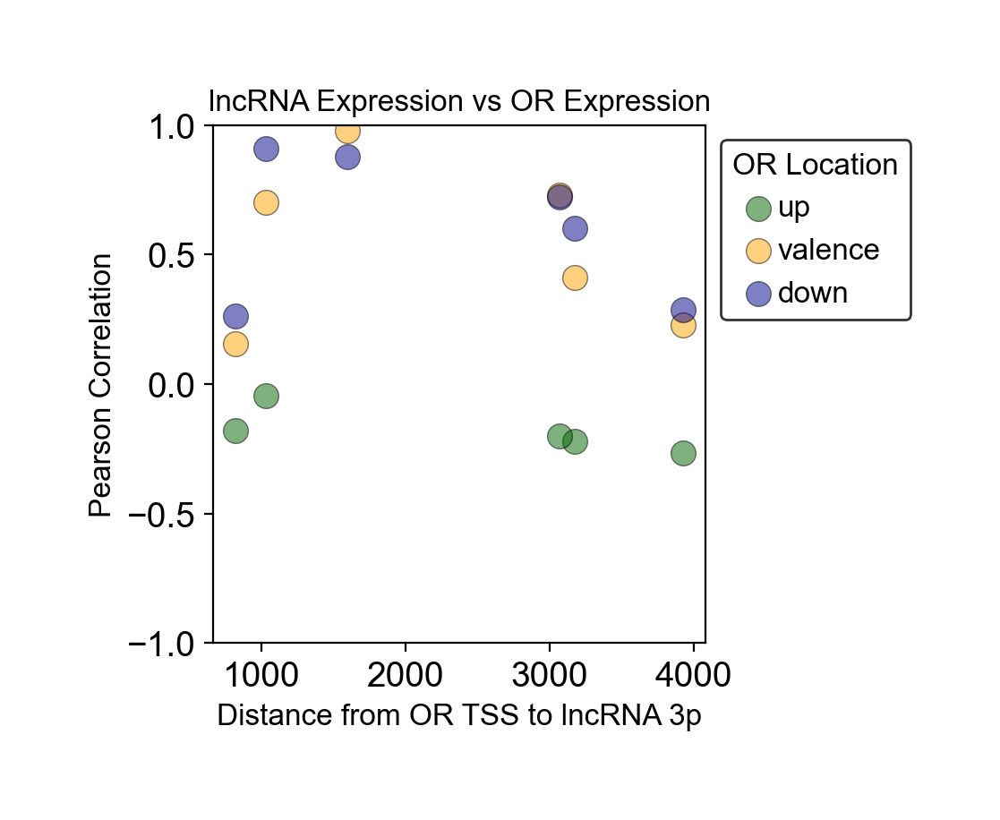

In [174]:
# Plot scatters of r_up, r_valence, r_down vs tss_2_lnc_end
white_plotting()
fontsize=12
f, ax = plt.subplots(1, 1, figsize=(5, 4))
colors = ['darkgreen', 'orange', 'darkblue']
for i, OR in enumerate(['up', 'valence', 'down']):
    sns.scatterplot(data=results, x='tss_2_lnc_end', y=f'r_{OR}', ax=ax, color=colors[i], s=100, label=OR, alpha=0.5, lw=0.5, edgecolor='black')
    ax.set_xlabel('Distance from OR TSS to lncRNA 3p', fontsize=fontsize)
    ax.set_ylabel('Pearson Correlation', fontsize=fontsize)
    ax.set_title('lncRNA Expression vs OR Expression', fontsize=fontsize)
    ax.set_ylim(-1, 1)

# legend outside 
plt.legend(title='OR Location', loc='upper left', fontsize=fontsize, title_fontsize=fontsize, bbox_to_anchor=(1, 1))
plt.tight_layout()

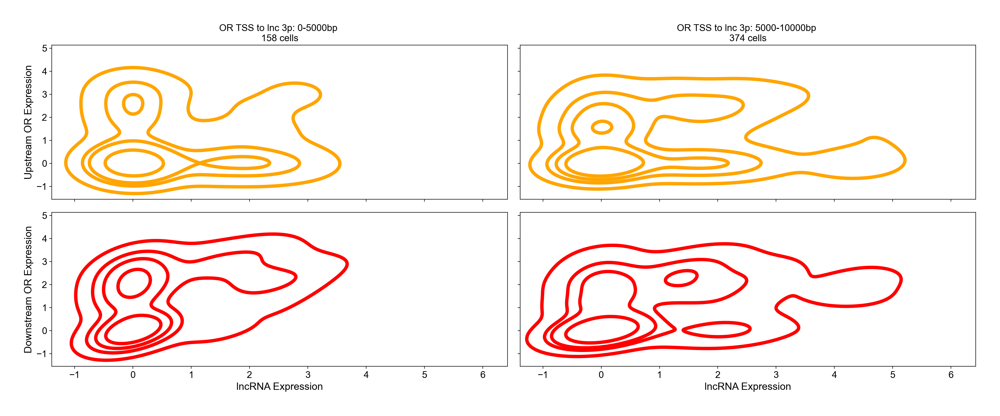

In [175]:
distances = [0, 5000, 10000] 
# For each tss_2_lnc_end bin, plot a scatter plot of upstream OR expression vs lncRNA expression
f, ax = plt.subplots(2, len(distances)-1, figsize=(20, 8), sharex=True, sharey=True)
for i in range(len(distances)-1): 
    min_dist = distances[i]
    max_dist = distances[i+1]
    cell_valence_OR_bin = cell_valence_OR[(cell_valence_OR['tss_2_lnc_end'] > min_dist) & (cell_valence_OR['tss_2_lnc_end'] < max_dist)]
    
    # Upstream 
    sns.kdeplot(data=cell_valence_OR_bin, x='lncRNA_expression', y='upstream_OR_expression', ax=ax[0, i], color='orange', levels=5, linewidths=5)
    r, p = pearsonr(cell_valence_OR_bin['lncRNA_expression'], cell_valence_OR_bin['upstream_OR_expression'])
    ax[0, i].text(0.4, 0.9, f'R={r:.4f}, p={p:.4f}', fontsize=12, ha='center', va='center', transform=ax[0, i].transAxes, color='white')
    ax[0, i].set_ylabel('Upstream OR Expression', fontsize=15)
    ax[0, i].set_title(f'OR TSS to lnc 3p: {min_dist}-{max_dist}bp \n{cell_valence_OR_bin.shape[0]} cells')

    # Downstream 
    sns.kdeplot(data=cell_valence_OR_bin, x='lncRNA_expression', y='downstream_OR_expression', ax=ax[1, i], color='red', levels=5, linewidths=5)
    r, p = pearsonr(cell_valence_OR_bin['lncRNA_expression'], cell_valence_OR_bin['downstream_OR_expression'])
    ax[1, i].text(0.4, 0.9, f'R={r:.4f}, p={p:.4f}', fontsize=12, ha='center', va='center', transform=ax[1, i].transAxes, color='white')
    ax[1, i].set_ylabel('Downstream OR Expression', fontsize=15)
    ax[1, i].set_xlabel('lncRNA Expression', fontsize=15)

plt.tight_layout()
plt.show()

# Split by Upstream > Downstream 

In [176]:
# upstream vs downstream? 
cell_valence_OR['upstream_or_downstream'] = cell_valence_OR.apply(lambda x: 'upstream' if x['upstream_OR_expression'] > x['downstream_OR_expression'] else 'downstream', axis=1)
upstream_vs_downstream_counts = cell_valence_OR['upstream_or_downstream'].value_counts()
upstream_vs_downstream_counts

upstream_or_downstream
downstream    372
upstream      160
Name: count, dtype: int64

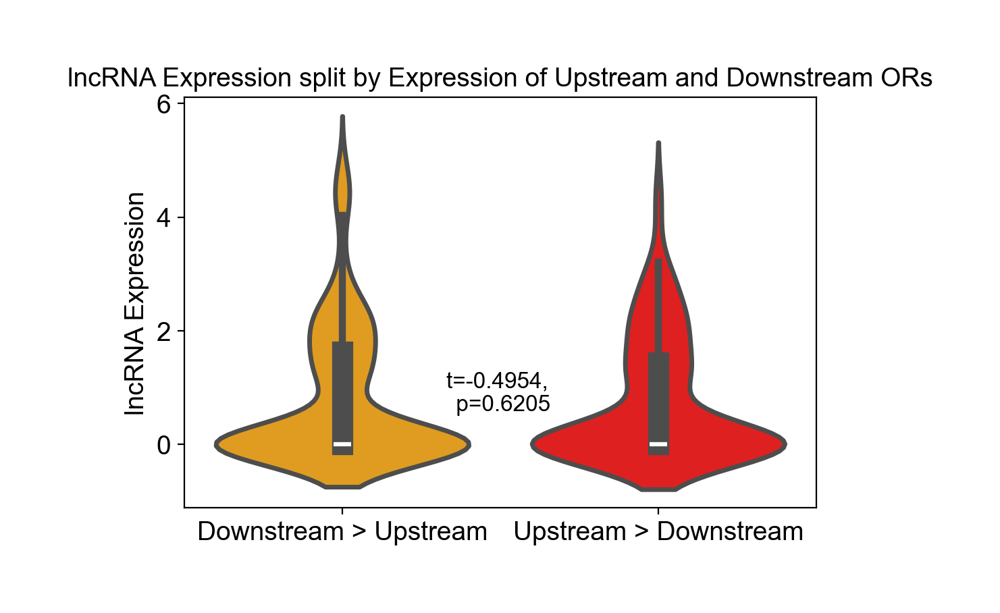

In [177]:
# violin plot lncRNA expression split by upstream and downstream OR expression
plt.figure(figsize=(6, 4))
sns.violinplot(data=cell_valence_OR, x='upstream_or_downstream', y='lncRNA_expression', palette=['orange', 'red'], linewidth=2.5)
plt.xticks([0, 1], ['Downstream > Upstream', 'Upstream > Downstream'])
plt.xlabel('')
plt.ylabel('lncRNA Expression')
plt.title('lncRNA Expression split by Expression of Upstream and Downstream ORs')
# Get p-value for difference in lncRNA expression between upstream and downstream
from scipy.stats import ttest_ind
t_statistic, pvalue = ttest_ind(cell_valence_OR[cell_valence_OR['upstream_or_downstream'] == 'upstream']['lncRNA_expression'], cell_valence_OR[cell_valence_OR['upstream_or_downstream'] == 'downstream']['lncRNA_expression'])
plt.text(0.5, 0.9, f't={t_statistic:.4f}, \n p={pvalue:.4f}', fontsize=12, ha='center', va='center')
plt.show()